# Dependencies and imports

In [ ]:
!apt-get -y install fonts-noto-cjk

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
Suggested packages:
  fonts-noto-cjk-extra
The following NEW packages will be installed:
  fonts-noto-cjk
0 upgraded, 1 newly installed, 0 to remove and 35 not upgraded.
Need to get 61.2 MB of archives.
After this operation, 93.2 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/main amd64 fonts-noto-cjk all 1:20220127+repack1-1 [61.2 MB]
Fetched 61.2 MB in 6s (9,921 kB/s)
Selecting previously unselected package fonts-noto-cjk.
(Reading database ... 126284 files and directories currently installed.)
Preparing to unpack .../fonts-noto-cjk_1%3a20220127+repack1-1_all.deb ...
Unpacking fonts-noto-cjk (1:20220127+repack1-1) ...
Setting up fonts-noto-cjk (1:20220127+repack1-1) ...
Processing triggers for fontconfig (2.13.1-4.2ubuntu5) ...


In [ ]:
!pip install pytesseract easyocr jiwer cnocr onnxruntime-gpu Levenshtein

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 88.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 225.9/225.9 kB 24.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 283.2/283.2 MB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 161.7/161.7 kB 17.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 254.3/254.3 kB 23.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 825.4/825.4 kB 47.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 84.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.0/15.0 MB 91.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 969.6/969.6 kB 63.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 125.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 89.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
import os
import re
import csv
import json
import copy
from collections import OrderedDict

import pandas as pd
import numpy as np

from PIL import Image
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.font_manager as fm

import pytesseract
import easyocr
from jiwer import cer
import Levenshtein

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch.nn.utils.rnn import pad_sequence

import torchvision.transforms as T
from torchvision import transforms

from tqdm import tqdm

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

import seaborn as sns
import shutil


# Dataset download and processing

Zipped dataset is downloaded and unzipped from drive into Colab session

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
!unzip -q /content/drive/MyDrive/computerVisionProject/dataset.zip -d /content/

Mounted at /content/drive


In [ ]:
base_dir = '/content/content/dataset/CCPD2019/ccpd_base'

def count_files(path):
    count = 0
    with os.scandir(path) as entries:
        for entry in entries:
            if entry.is_file():
                count += 1
    return count

num_files = count_files(base_dir)
print(f"Numero totale di file: {num_files}")

Numero totale di file: 199996


In [ ]:
images = os.listdir(base_dir)
image_example = images[0]
print(image_example)

def extract_bbox_from_filename(filename):
    """
    Estrae xmin, ymin, xmax, ymax dal nome file CCPD.
    """
    if filename.endswith('.jpg'):
        filename = filename[:-4]

    fields = filename.split('-')
    if len(fields) != 7:
        raise ValueError(f"Unexpected format: {filename}")

    bbox_field = fields[2]  # Terzo campo = bounding box

    try:
        top_left_str, bottom_right_str = bbox_field.split('_')
        xmin, ymin = map(int, top_left_str.split('&'))
        xmax, ymax = map(int, bottom_right_str.split('&'))
    except:
        raise ValueError(f"Could not parse bounding box: {bbox_field}")

    return xmin, ymin, xmax, ymax


print(extract_bbox_from_filename(image_example))

0385596264367-87_92-174&480_483&594-493&571_191&599_196&493_498&465-0_0_32_31_8_31_33-143-85.jpg
(174, 480, 483, 594)


create a csv file with filename and ground truth box for each *image*

In [ ]:

writer = csv.writer(open('annotation.csv', 'w', newline=''))
writer.writerow(['fname', 'x_min', 'y_min', 'x_max', 'y_max'])

for fname in images:
  if not fname.endswith('.jpg'):
                continue
  try:
      xmin, ymin, xmax, ymax = extract_bbox_from_filename(fname)
      writer.writerow([fname, xmin, ymin, xmax, ymax])
  except Exception as e:
      print(f"Skipping {fname}: {e}")

# Detection Baseline - SimpleCNN

## Datset class and model architecture

In [ ]:
class CCPDDataset(Dataset):
    def __init__(self, csv_file, root_dir, transform=None, img_size=224):
        self.annotations = pd.read_csv(csv_file)
        self.root_dir = root_dir
        self.transform = transform
        self.img_size = img_size

    def __len__(self):
        return len(self.annotations)

    def __getitem__(self, idx):
        row = self.annotations.iloc[idx]
        img_path = os.path.join(self.root_dir, row['fname'])
        #print(img_path)
        image = Image.open(img_path).convert("RGB")
        w, h = image.size

        # Normalize bbox
        xmin = row['x_min'] / w
        ymin = row['y_min'] / h
        xmax = row['x_max'] / w
        ymax = row['y_max'] / h
        bbox = torch.tensor([xmin, ymin, xmax, ymax], dtype=torch.float32)

        if self.transform:
            image = self.transform(image)

        return image, bbox

transform = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor()
])


In [ ]:
class SimpleCNNDetector(nn.Module):
    def __init__(self):
        super(SimpleCNNDetector, self).__init__()
        self.conv1 = nn.Conv2d(3, 16, 3, stride=2, padding=1)
        self.conv2 = nn.Conv2d(16, 32, 3, stride=2, padding=1)
        self.conv3 = nn.Conv2d(32, 64, 3, stride=2, padding=1)
        self.fc1 = nn.Linear(64 * 28 * 28, 128)
        self.fc2 = nn.Linear(128, 4)  # Output bbox (xmin, ymin, xmax, ymax)

    def forward(self, x):
        x = F.relu(self.conv1(x))  # -> [B, 16, 112, 112]
        x = F.relu(self.conv2(x))  # -> [B, 32, 56, 56]
        x = F.relu(self.conv3(x))  # -> [B, 64, 28, 28]
        x = x.view(x.size(0), -1)  # Flatten
        x = F.relu(self.fc1(x))
        return torch.sigmoid(self.fc2(x))  # normalized to [0,1]


## Training and evaluation

In [ ]:
df = pd.read_csv('annotation.csv')
train_df, val_df = train_test_split(df, test_size=0.2, random_state=42)
train_df.sample(n=10000, random_state=42).to_csv('train.csv', index=False)
val_df.sample(n=2000, random_state=42).to_csv('val.csv', index=False)

In [ ]:
train_dataset = CCPDDataset('train.csv', '/content/content/dataset/CCPD2019/ccpd_base', transform=transform)
val_dataset = CCPDDataset('val.csv', '/content/content/dataset/CCPD2019/ccpd_base', transform=transform)

train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=128, shuffle=False)

In [ ]:
def compute_iou(boxA, boxB):
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    # compute the area of intersection rectangle
    interArea = max(0, xB - xA) * max(0, yB - yA)

    # compute the area of both the prediction and ground-truth
    # rectangles
    boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])

    # compute the intersection over union by taking the intersection
    # area and dividing it by the sum of prediction + ground-truth
    # areas - the intersection area
    iou = interArea / float(boxAArea + boxBArea - interArea)

    return iou

def evaluate(model, val_loader):
    model.eval()
    total_iou = 0
    total_val_loss = 0
    criterion = nn.SmoothL1Loss()
    with torch.no_grad():
        for images, targets in val_loader:
            images, targets = images.to(device), targets.to(device)
            preds = model(images)

            val_loss = criterion(preds, targets)
            total_val_loss += val_loss.item()

            for p, t in zip(preds, targets):
                iou = compute_iou(p.cpu().numpy(), t.cpu().numpy())
                total_iou += iou

    avg_val_iou = total_iou / len(val_loader.dataset)
    avg_val_loss = total_val_loss / len(val_loader)
    return avg_val_iou, avg_val_loss


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print('Device:', device)

# Parameters
epochs = 20
patience = 3  # max num of epochs without improvements
best_iou = 0
counter = 0
save_path = "best_detector_model.pt"

model = SimpleCNNDetector().to(device)
criterion = nn.SmoothL1Loss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)

for epoch in range(epochs):
    model.train()
    running_loss = 0
    for images, targets in tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs}"):
        images, targets = images.to(device), targets.to(device)

        preds = model(images)
        loss = criterion(preds, targets)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_loss += loss.item()


    val_iou, val_loss = evaluate(model, val_loader)
    print(f"[Epoch {epoch+1}] Train Loss: {running_loss / len(train_loader):.4f} | Val IoU: {val_iou:.4f} | Val Loss: {val_loss:.4f}")


    if val_iou > best_iou:
        print(f"✓ New best IoU: {val_iou:.4f} (prev: {best_iou:.4f}). Saving model to {save_path}")
        best_iou = val_iou
        counter = 0
        torch.save(model.state_dict(), save_path)
    else:
        counter += 1
        print(f"✗ No improvement in IoU for {counter} epoch(s).")
        if counter >= patience:
            print("Early stopping triggered.")
            break




Device: cuda


Epoch 1/20: 100%|██████████| 79/79 [02:20<00:00,  1.78s/it]


[Epoch 1] Train Loss: 0.0050 | Val IoU: 0.3680 | Val Loss: 0.0033
✓ New best IoU: 0.3680 (prev: 0.0000). Saving model to best_detector_model.pt


Epoch 2/20: 100%|██████████| 79/79 [01:52<00:00,  1.43s/it]


[Epoch 2] Train Loss: 0.0023 | Val IoU: 0.5123 | Val Loss: 0.0014
✓ New best IoU: 0.5123 (prev: 0.3680). Saving model to best_detector_model.pt


Epoch 3/20: 100%|██████████| 79/79 [01:49<00:00,  1.39s/it]


[Epoch 3] Train Loss: 0.0014 | Val IoU: 0.5758 | Val Loss: 0.0012
✓ New best IoU: 0.5758 (prev: 0.5123). Saving model to best_detector_model.pt


Epoch 4/20: 100%|██████████| 79/79 [01:49<00:00,  1.39s/it]


[Epoch 4] Train Loss: 0.0011 | Val IoU: 0.6035 | Val Loss: 0.0010
✓ New best IoU: 0.6035 (prev: 0.5758). Saving model to best_detector_model.pt


Epoch 5/20: 100%|██████████| 79/79 [01:47<00:00,  1.37s/it]


[Epoch 5] Train Loss: 0.0010 | Val IoU: 0.6286 | Val Loss: 0.0009
✓ New best IoU: 0.6286 (prev: 0.6035). Saving model to best_detector_model.pt


Epoch 6/20: 100%|██████████| 79/79 [01:49<00:00,  1.39s/it]


[Epoch 6] Train Loss: 0.0008 | Val IoU: 0.6211 | Val Loss: 0.0009
✗ No improvement in IoU for 1 epoch(s).


Epoch 7/20: 100%|██████████| 79/79 [01:49<00:00,  1.39s/it]


[Epoch 7] Train Loss: 0.0007 | Val IoU: 0.6379 | Val Loss: 0.0008
✓ New best IoU: 0.6379 (prev: 0.6286). Saving model to best_detector_model.pt


Epoch 8/20: 100%|██████████| 79/79 [01:49<00:00,  1.39s/it]


[Epoch 8] Train Loss: 0.0006 | Val IoU: 0.6420 | Val Loss: 0.0007
✓ New best IoU: 0.6420 (prev: 0.6379). Saving model to best_detector_model.pt


Epoch 9/20: 100%|██████████| 79/79 [01:49<00:00,  1.39s/it]


[Epoch 9] Train Loss: 0.0005 | Val IoU: 0.6694 | Val Loss: 0.0007
✓ New best IoU: 0.6694 (prev: 0.6420). Saving model to best_detector_model.pt


Epoch 10/20: 100%|██████████| 79/79 [01:50<00:00,  1.40s/it]


[Epoch 10] Train Loss: 0.0005 | Val IoU: 0.6599 | Val Loss: 0.0007
✗ No improvement in IoU for 1 epoch(s).


Epoch 11/20: 100%|██████████| 79/79 [01:50<00:00,  1.40s/it]


[Epoch 11] Train Loss: 0.0005 | Val IoU: 0.6629 | Val Loss: 0.0007
✗ No improvement in IoU for 2 epoch(s).


Epoch 12/20: 100%|██████████| 79/79 [01:50<00:00,  1.39s/it]


[Epoch 12] Train Loss: 0.0004 | Val IoU: 0.6600 | Val Loss: 0.0007
✗ No improvement in IoU for 3 epoch(s).
Early stopping triggered.


In [ ]:
best_model = SimpleCNNDetector().to(device)
best_model.load_state_dict(torch.load("best_detector_model.pt"))
model = best_model
model.eval()

SimpleCNNDetector(
  (conv1): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (fc1): Linear(in_features=50176, out_features=128, bias=True)
  (fc2): Linear(in_features=128, out_features=4, bias=True)
)

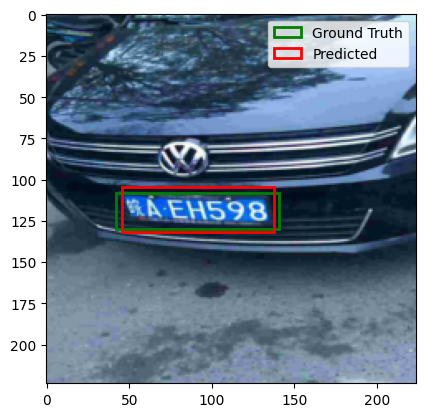

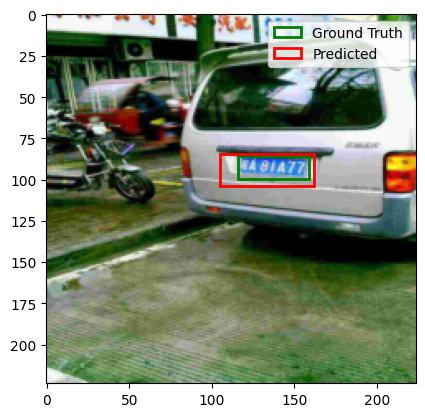

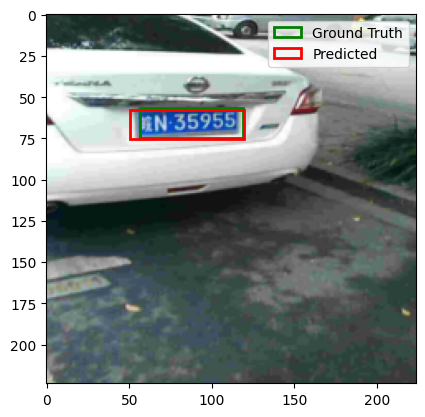

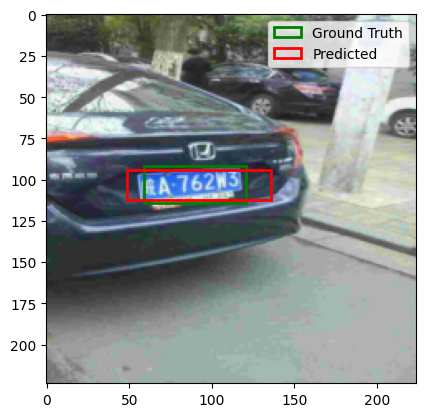

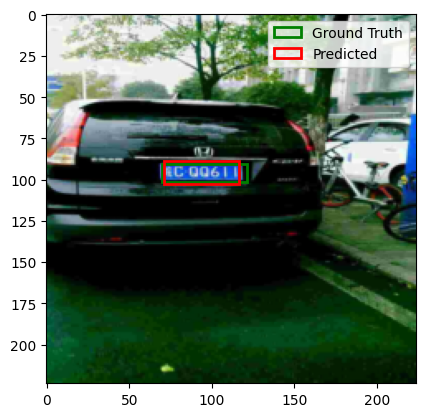

In [ ]:

def plot_image_with_bbox(image, ground_truth_bbox, predicted_bbox):
    fig, ax = plt.subplots(1)
    image = T.ToPILImage()(image.cpu())
    ax.imshow(image)

    # Add green gt bbox
    gt_xmin, gt_ymin, gt_xmax, gt_ymax = ground_truth_bbox.cpu().numpy()
    rect_gt = patches.Rectangle((gt_xmin * image.width, gt_ymin * image.height),
                                (gt_xmax - gt_xmin) * image.width, (gt_ymax - gt_ymin) * image.height,
                                linewidth=2, edgecolor='g', facecolor='none', label='Ground Truth')
    ax.add_patch(rect_gt)

    # Add red predictied bbox
    pred_xmin, pred_ymin, pred_xmax, pred_ymax = predicted_bbox.cpu().numpy()
    rect_pred = patches.Rectangle((pred_xmin * image.width, pred_ymin * image.height),
                                  (pred_xmax - pred_xmin) * image.width, (pred_ymax - pred_ymin) * image.height,
                                  linewidth=2, edgecolor='r', facecolor='none', label='Predicted')
    ax.add_patch(rect_pred)

    plt.legend()
    plt.show()

dataiter = iter(val_loader)
images, targets = next(dataiter)

images = images.to(device)
targets = targets.to(device)

model.eval()
with torch.no_grad():
    predictions = model(images)

for i in range(min(5, images.size(0))):
    plot_image_with_bbox(images[i], targets[i], predictions[i])

# Detection final model - YOLOv5

## Yolo training

In [ ]:
# Clone YOLOv5
!git clone https://github.com/ultralytics/yolov5.git

%cd yolov5

# Dependencies installation
!pip install -r requirements.txt

!pip install -U albumentations==1.3.0


Cloning into 'yolov5'...
remote: Enumerating objects: 17516, done.
remote: Counting objects: 100% (19/19), done.
remote: Compressing objects: 100% (19/19), done.
remote: Total 17516 (delta 6), reused 0 (delta 0), pack-reused 17497 (from 4)
Receiving objects: 100% (17516/17516), 16.61 MiB | 12.24 MiB/s, done.
Resolving deltas: 100% (11994/11994), done.
/content/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 52.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 123.5/123.5 kB 10.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.8/16.8 MB 96.7 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.24.1
    Uninstalling numpy-1.24.1:
      Successfully uninstalled numpy-1.24.1
  Attempting uninstall: albumentations
    Found existing installation: albumentations 2.0.8
    Uninstalling albumentations-2.0.8:
      Successfully uninstalled

In [ ]:
#cell to verify YOLO has all valid labels to learn


image_dir = '/content/ccpd_yolo_dataset/images/train'
label_dir = '/content/ccpd_yolo_dataset/labels/train'

missing = []
empty = []

for img_file in os.listdir(image_dir):
    if img_file.endswith('.jpg'):
        label_file = img_file.replace('.jpg', '.txt')
        label_path = os.path.join(label_dir, label_file)

        if not os.path.exists(label_path):
            missing.append(img_file)
        else:
            with open(label_path, 'r') as f:
                lines = f.readlines()
                if len(lines) == 0:
                    empty.append(img_file)

print(f"🔍 Immagini senza file .txt: {len(missing)}")
print(f"🕳️ Immagini con file .txt vuoto: {len(empty)}")


🔍 Immagini senza file .txt: 0
🕳️ Immagini con file .txt vuoto: 0


In [ ]:

!python train.py \
  --img 416 \
  --batch 16 \
  --epochs 20 \
  --data /content/ccpd.yaml \
  --weights yolov5s.pt \
  --project /content/yolov5_training \
  --name ccpd_test_run \
  --cache


Output streaming troncato alle ultime 5000 righe.
      19/19      1.83G    0.01775    0.00421          0         33        416:  75% 7506/10000 [08:53<02:55, 14.18it/s]/content/yolov5/train.py:414: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      19/19      1.83G    0.01775    0.00421          0         27        416:  75% 7508/10000 [08:53<02:57, 14.06it/s]/content/yolov5/train.py:414: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      19/19      1.83G    0.01775    0.00421          0         31        416:  75% 7508/10000 [08:53<02:57, 14.06it/s]/content/yolov5/train.py:414: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      19/19      1.83G 

In [ ]:
# Saving the weights on the drive

!cp -r /content/yolov5_training/ccpd_test_run/weights /content/drive/MyDrive/computerVisionProject/yolov5_weights1

# Saving the results
!mkdir -p /content/drive/MyDrive/computerVisionProject/yolov5_logs1
!cp -r /content/yolov5_training/ccpd_test_run/* /content/drive/MyDrive/computerVisionProject/yolov5_logs1/


In [ ]:

model = torch.hub.load('', 'custom', path='/content/drive/MyDrive/computerVisionProject/yolov5_training/ccpd_test_run/weights/best.pt', source='local')


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


YOLOv5 🚀 v7.0-422-g2540fd4c Python-3.11.13 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 


## YOLO testing

In [ ]:


def compute_iou(gt, pred):
    xi1 = max(gt['xmin'], pred['xmin'])
    yi1 = max(gt['ymin'], pred['ymin'])
    xi2 = min(gt['xmax'], pred['xmax'])
    yi2 = min(gt['ymax'], pred['ymax'])

    inter_width = max(0, xi2 - xi1)
    inter_height = max(0, yi2 - yi1)
    inter_area = inter_width * inter_height

    gt_area = (gt['xmax'] - gt['xmin']) * (gt['ymax'] - gt['ymin'])
    pred_area = (pred['xmax'] - pred['xmin']) * (pred['ymax'] - pred['ymin'])

    union_area = gt_area + pred_area - inter_area
    if union_area == 0:
        return 0
    return inter_area / union_area

# Directory to test
ccpd_dirs = [
    'ccpd_blur', 'ccpd_challenge', 'ccpd_db', 'ccpd_fn',
    'ccpd_np', 'ccpd_rotate', 'ccpd_tilt', 'ccpd_weather', 'ccpd_base'
]

base_path = '/content/dataset_v2/content/dataset/CCPD2019/'
output_dir = '/content/predictions_csv/'
summary_file = '/content/iou_summary.csv'

os.makedirs(output_dir, exist_ok=True)

summary = []

for folder in ccpd_dirs:
    print(f"🔍 Processing: {folder}")
    image_dir = os.path.join(base_path, folder)
    images = glob(f"{image_dir}/*.jpg")

    results = []
    iou_by_image = {}

    for img_path in images:
        img_name = os.path.basename(img_path)


        try:
            parts = img_name.split('-')
            bbox = parts[2]
            topleft, bottomright = bbox.split('_')
            x1, y1 = map(int, topleft.split('&'))
            x2, y2 = map(int, bottomright.split('&'))
        except Exception as e:
            print(f"❌ Errore parsing file: {img_name} — {e}")
            continue


        results_yolo = model(img_path)
        pred = results_yolo.pandas().xyxy[0]

        best_iou = 0

        for _, row in pred.iterrows():
            pred_box = {
                'xmin': int(row['xmin']),
                'ymin': int(row['ymin']),
                'xmax': int(row['xmax']),
                'ymax': int(row['ymax'])
            }

            gt_box = {'xmin': x1, 'ymin': y1, 'xmax': x2, 'ymax': y2}
            iou = compute_iou(gt_box, pred_box)
            best_iou = max(best_iou, iou)

            results.append({
                'file': img_name,
                #'gt_xmin': x1,
                #'gt_ymin': y1,
                #'gt_xmax': x2,
                #'gt_ymax': y2,
                'pred_xmin': pred_box['xmin'],
                'pred_ymin': pred_box['ymin'],
                'pred_xmax': pred_box['xmax'],
                'pred_ymax': pred_box['ymax'],
                'confidence': float(row['confidence']),
                'class': row['name'],
                'iou': round(iou, 4)
            })

        iou_by_image[img_name] = best_iou


    total = len(iou_by_image)
    passed = sum(1 for val in iou_by_image.values() if val > 0.7)
    perc = round(passed / total * 100, 2) if total > 0 else 0.0

    print(f"📊 {folder}: {passed}/{total} immagini con IoU > 0.7 ({perc}%)")

    summary.append({
        'category': folder,
        'total_images': total,
        'images_with_iou_>_0.7': passed,
        'percentage': perc
    })

    df = pd.DataFrame(results)
    csv_path = os.path.join(output_dir, f'{folder}.csv')
    df.to_csv(csv_path, index=False)
    print(f"✅ CSV salvato per {folder}: {csv_path}")


df_summary = pd.DataFrame(summary)
df_summary.to_csv(summary_file, index=False)
print(f"\n📁 Riepilogo salvato: {summary_file}")


🔍 Processing: ccpd_blur


Output streaming troncato alle ultime 5000 righe.
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(a

📊 ccpd_blur: 16643/20611 immagini con IoU > 0.7 (80.75%)
✅ CSV salvato per ccpd_blur: /content/predictions_csv/ccpd_blur.csv
🔍 Processing: ccpd_challenge


Output streaming troncato alle ultime 5000 righe.
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(a

📊 ccpd_challenge: 45586/50003 immagini con IoU > 0.7 (91.17%)
✅ CSV salvato per ccpd_challenge: /content/predictions_csv/ccpd_challenge.csv
🔍 Processing: ccpd_db


Output streaming troncato alle ultime 5000 righe.
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(a

📊 ccpd_db: 6193/10132 immagini con IoU > 0.7 (61.12%)
✅ CSV salvato per ccpd_db: /content/predictions_csv/ccpd_db.csv
🔍 Processing: ccpd_fn


Output streaming troncato alle ultime 5000 righe.
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(a

📊 ccpd_fn: 15893/20967 immagini con IoU > 0.7 (75.8%)
✅ CSV salvato per ccpd_fn: /content/predictions_csv/ccpd_fn.csv
🔍 Processing: ccpd_np
❌ Errore parsing file: 2627.jpg — list index out of range
❌ Errore parsing file: 3166.jpg — list index out of range
❌ Errore parsing file: 2709.jpg — list index out of range
❌ Errore parsing file: 4834.jpg — list index out of range
❌ Errore parsing file: 3442.jpg — list index out of range
❌ Errore parsing file: 4966.jpg — list index out of range
❌ Errore parsing file: 3809.jpg — list index out of range
❌ Errore parsing file: 5824.jpg — list index out of range
❌ Errore parsing file: 5134.jpg — list index out of range
❌ Errore parsing file: 5301.jpg — list index out of range
❌ Errore parsing file: 5258.jpg — list index out of range
❌ Errore parsing file: 2665.jpg — list index out of range
❌ Errore parsing file: 1745.jpg — list index out of range
❌ Errore parsing file: 4074.jpg — list index out of range
❌ Errore parsing file: 4717.jpg — list index out

Output streaming troncato alle ultime 5000 righe.
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(a

📊 ccpd_rotate: 9450/10053 immagini con IoU > 0.7 (94.0%)
✅ CSV salvato per ccpd_rotate: /content/predictions_csv/ccpd_rotate.csv
🔍 Processing: ccpd_tilt


Output streaming troncato alle ultime 5000 righe.
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(a

📊 ccpd_tilt: 24525/30216 immagini con IoU > 0.7 (81.17%)
✅ CSV salvato per ccpd_tilt: /content/predictions_csv/ccpd_tilt.csv
🔍 Processing: ccpd_weather


Output streaming troncato alle ultime 5000 righe.
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(a

📊 ccpd_weather: 9825/9999 immagini con IoU > 0.7 (98.26%)
✅ CSV salvato per ccpd_weather: /content/predictions_csv/ccpd_weather.csv
🔍 Processing: ccpd_base


Output streaming troncato alle ultime 5000 righe.
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(a

📊 ccpd_base: 198764/199996 immagini con IoU > 0.7 (99.38%)
✅ CSV salvato per ccpd_base: /content/predictions_csv/ccpd_base.csv

📁 Riepilogo salvato: /content/iou_summary.csv


In [ ]:
# YOLO results
df = pd.read_csv('/content/iou_summary.csv')
print(df)

         category  total_images  images_with_iou_>_0.7  percentage
0       ccpd_blur         20611                  16643       80.75
1  ccpd_challenge         50003                  45586       91.17
2         ccpd_db         10132                   6193       61.12
3         ccpd_fn         20967                  15893       75.80
4         ccpd_np             0                      0        0.00
5     ccpd_rotate         10053                   9450       94.00
6       ccpd_tilt         30216                  24525       81.17
7    ccpd_weather          9999                   9825       98.26
8       ccpd_base        199996                 198764       99.38


## YOLO evaluation


Accuracy: 99.43% (39765/39991)


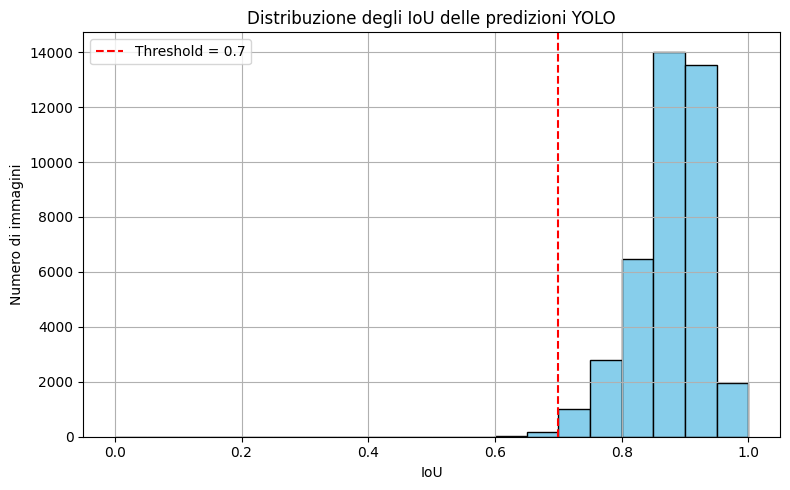

In [ ]:
pred_df = pd.read_csv('/content/yolo_predictions_base.csv')
gt_df = pd.read_csv('/content/annotation.csv')

merged_df = pd.merge(pred_df, gt_df, left_on='filename', right_on='fname')
merged_df

def compute_iou(boxA, boxB):
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])
    interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)

    boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
    boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)

    iou = interArea / float(boxAArea + boxBArea - interArea)
    return iou

ious = []
for _, row in merged_df.iterrows():
    pred_box = [row['x1'], row['y1'], row['x2'], row['y2']]
    gt_box = [row['x_min'], row['y_min'], row['x_max'], row['y_max']]
    iou = compute_iou(pred_box, gt_box)
    ious.append(iou)

merged_df['iou'] = ious


threshold = 0.7
correct = (merged_df['iou'] >= threshold).sum()
total = len(merged_df)
accuracy = correct / total
print(f"Accuracy: {accuracy * 100:.2f}% ({correct}/{total})")

plt.figure(figsize=(8, 5))
plt.hist(merged_df['iou'], bins=20, color='skyblue', edgecolor='black')
plt.axvline(0.7, color='red', linestyle='--', label='Threshold = 0.7')
plt.title("Distribuzione degli IoU delle predizioni YOLO")
plt.xlabel("IoU")
plt.ylabel("Numero di immagini")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

## Function to crop images using Yolo-v5 predictions



In [ ]:

# INPUT
dataset_name = 'base'
img_root = os.path.join('/content/content/dataset/CCPD2019', f'ccpd_{dataset_name}')

crop_dir = f'/content/yolo_crops_{dataset_name}'
yolo_csv = f'/content/yolo_preds_{dataset_name}.csv'
output_csv = f'/content/yolo_crops_labels_{dataset_name}.csv'

if os.path.exists(crop_dir):
    shutil.rmtree(crop_dir)
os.makedirs(crop_dir, exist_ok=True)

# load yolo preds
df = pd.read_csv(yolo_csv)

def extract_plate_from_fname(fname):
    try:
        provinces = ["皖", "沪", "津", "渝", "冀", "晋", "蒙", "辽", "吉", "黑", "苏", "浙", "京", "闽", "赣", "鲁",
                     "豫", "鄂", "湘", "粤", "桂", "琼", "川", "贵", "云", "藏", "陕", "甘", "青", "宁", "新", "警", "学", "O"]
        alphabets = list("ABCDEFGHJKLMNPQRSTUVWXYZO")
        ads = list("ABCDEFGHJKLMNPQRSTUVWXYZ0123456789O")

        lp_encoded = fname.split('-')[4]
        codes = list(map(int, lp_encoded.split('_')))
        plate = provinces[codes[0]] + alphabets[codes[1]] + ''.join(ads[i] for i in codes[2:])
        return plate.replace('O', '')
    except:
        return None

rows = []

for i, row in tqdm(df.iterrows(), total=len(df)):
    fname = row['filename']
    img_path = os.path.join(img_root, fname)

    if not os.path.exists(img_path):
        continue

    try:
        if row['iou'] >= 0.6:
            x1, y1, x2, y2 = int(row['x1']), int(row['y1']), int(row['x2']), int(row['y2'])
            img = Image.open(img_path).convert("RGB")
            crop = img.crop((x1, y1, x2, y2))

            crop_fname = f"crop_{i}_{fname}"
            crop_path = os.path.join(crop_dir, crop_fname)
            crop.save(crop_path)

            plate = extract_plate_from_fname(fname)
            if plate and len(plate) == 7:
                rows.append({'filename': crop_fname, 'plate': plate})

    except Exception as e:
        print(f"Errore su {fname}: {e}")

# Save new csv
df_out = pd.DataFrame(rows)
df_out.to_csv(output_csv, index=False)
print(f"✅ Crops salvati in: {crop_dir}")
print(f"✅ CSV etichette salvato in: {output_csv}")



100%|██████████| 200581/200581 [21:23<00:00, 156.31it/s]


✅ Crops salvati in: /content/yolo_crops_base
✅ CSV etichette salvato in: /content/yolo_crops_labels_base.csv


In [ ]:
class InferenceDataset(Dataset):
    def __init__(self, csv_file, image_dir, transform=None):
        self.df = pd.read_csv(csv_file)
        self.image_dir = image_dir
        self.transform = transform or T.Compose([
            T.Resize((224, 224)),
            T.ToTensor()
        ])

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        fname = row['fname']
        image_path = os.path.join(self.image_dir, fname)

        # load image with PIL
        image = Image.open(image_path).convert("RGB")
        width, height = image.size

        # bounding box ground truth in pixel
        x_min, y_min, x_max, y_max = row[['x_min', 'y_min', 'x_max', 'y_max']].values.astype(float)

        # normalize
        x_min /= width
        x_max /= width
        y_min /= height
        y_max /= height

        bbox = torch.tensor([x_min, y_min, x_max, y_max], dtype=torch.float32)

        image = self.transform(image)

        return image, bbox, fname


In [ ]:
def compute_iou(box1, box2):
    # box = [x_min, y_min, x_max, y_max], normalized tra 0 e 1
    xA = max(box1[0], box2[0])
    yA = max(box1[1], box2[1])
    xB = min(box1[2], box2[2])
    yB = min(box1[3], box2[3])

    interW = max(0, xB - xA)
    interH = max(0, yB - yA)
    interArea = interW * interH

    box1Area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2Area = (box2[2] - box2[0]) * (box2[3] - box2[1])

    unionArea = box1Area + box2Area - interArea

    if unionArea == 0:
        return 0.0

    return interArea / unionArea


In [ ]:
# load subset
df = pd.read_csv("annotation.csv")
df_sample = df.sample(n=10000, random_state=42)
df_sample.to_csv("annotation_inference.csv", index=False)

inference_dataset = InferenceDataset("annotation_inference.csv", "/content/content/dataset/CCPD2019/ccpd_base")
inference_loader = torch.utils.data.DataLoader(inference_dataset, batch_size=64, shuffle=True)

model.eval()
correct = 0
total = 0
threshold = 0.7
ious = []

with torch.no_grad():
    for images, targets, fnames in tqdm(inference_loader):
        images = images.to(device)
        targets = targets.to(device)

        preds = model(images)

        for i in range(images.size(0)):
            iou = compute_iou(preds[i].cpu().numpy(), targets[i].cpu().numpy())
            ious.append(iou)
            if iou >= threshold:
                correct += 1
            total += 1

print(f"✔ Correct Predictions (IoU ≥ 70%): {correct}/{total} ({100 * correct / total:.2f}%)")


100%|██████████| 157/157 [02:11<00:00,  1.19it/s]

✔ Correct Predictions (IoU ≥ 70%): 5277/10000 (52.77%)


Image: 0372892720307-107_61-297&342_534&509-532&514_298&422_292&324_526&416-13_1_2_6_26_32_29-110-30.jpg, IoU: 0.47


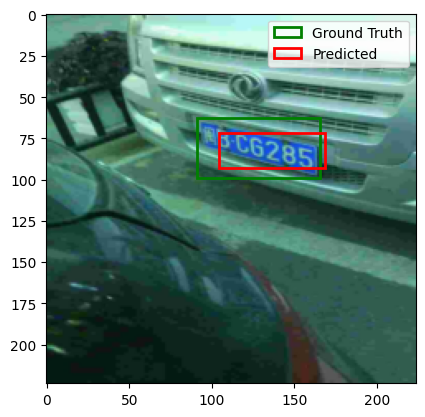

Image: 0290409482759-90_87-174&503_532&580-536&588_192&594_176&497_520&491-0_0_33_33_33_0_25-168-28.jpg, IoU: 0.91


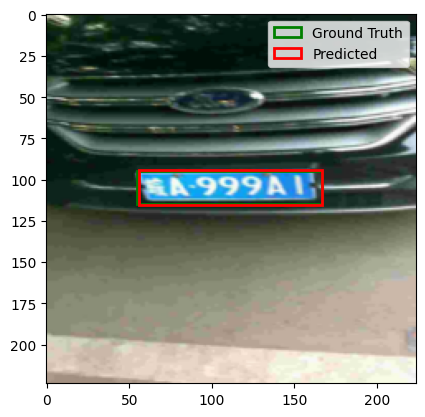

Image: 01-90_89-195&521_394&585-393&593_197&578_189&511_385&526-0_0_32_26_0_28_32-39-6.jpg, IoU: 0.37


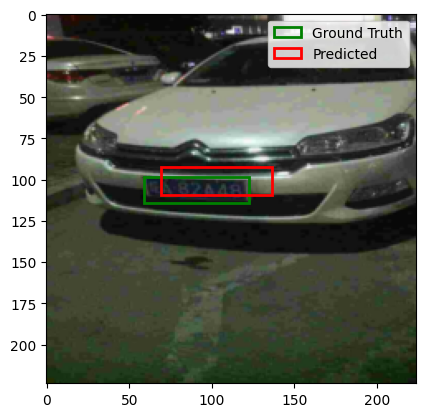

Image: 017349137931-89_89-440&558_662&643-654&633_447&647_451&564_658&550-0_0_21_19_24_26_26-114-52.jpg, IoU: 0.49


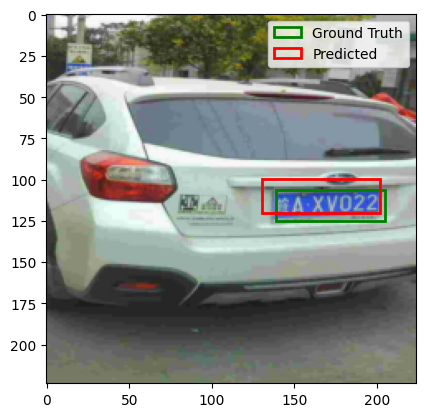

Image: 0231549329502-93_74-100&436_342&518-351&532_125&517_96&432_322&447-0_0_11_33_0_29_29-161-138.jpg, IoU: 0.00


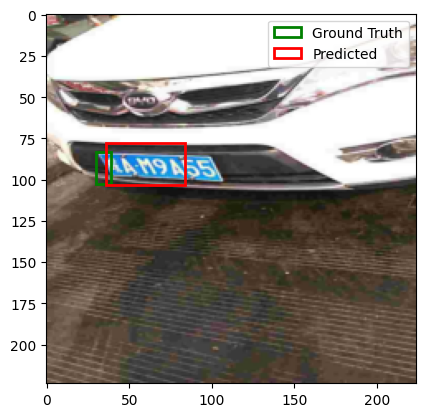

Image: 0133512931034-91_88-293&498_488&570-492&574_286&570_279&500_485&504-0_0_21_25_30_30_16-70-8.jpg, IoU: 0.40


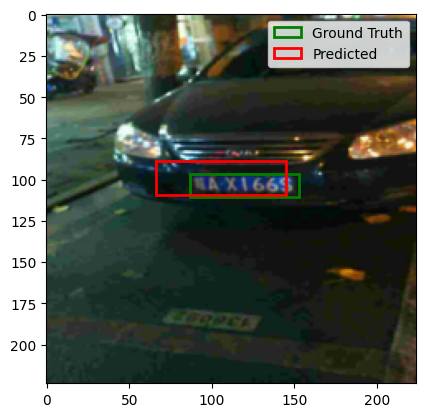

Image: 00491379310345-92_91-270&500_395&547-396&557_270&548_272&504_398&513-11_1_31_27_27_6_21-143-17.jpg, IoU: 0.36


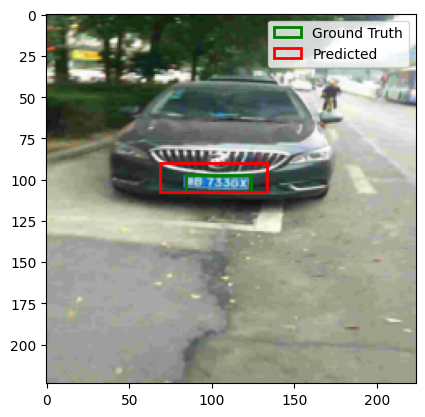

Image: 0232854406131-87_93-247&528_483&628-478&602_248&643_257&549_487&508-0_0_32_5_33_33_25-75-17.jpg, IoU: 0.24


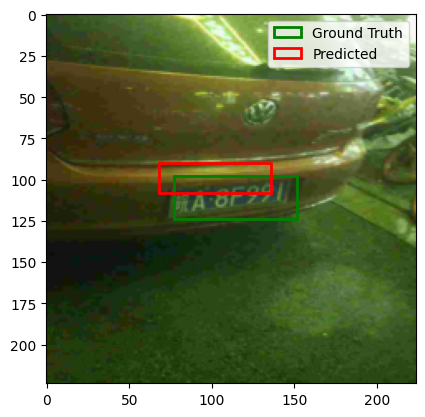

Image: 00521551724138-90_87-342&414_479&456-484&455_345&455_344&411_483&411-0_0_2_24_29_27_17-111-10.jpg, IoU: 0.22


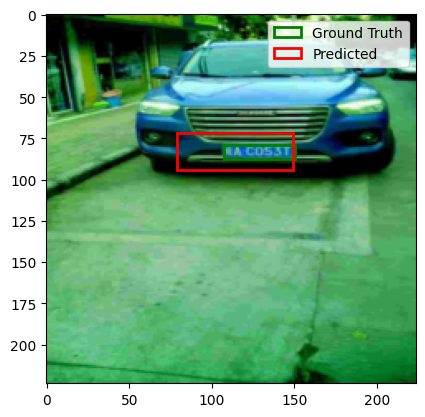

Image: 00873204022988-86_91-354&457_518&510-512&502_366&513_362&457_508&446-0_0_33_22_26_25_27-152-13.jpg, IoU: 0.49


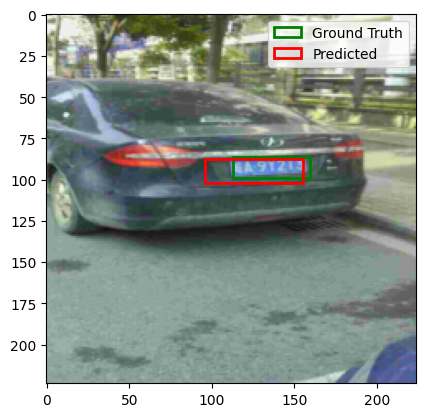

In [ ]:
model.eval()
visualized = 0
max_to_visualize = 10
threshold = 0.9

with torch.no_grad():
    for images, targets, fnames in inference_loader:
        images = images.to(device)
        preds = model(images)

        for i in range(images.size(0)):
            if visualized >= max_to_visualize:
                break

            iou = compute_iou(preds[i].cpu().numpy(), targets[i].cpu().numpy())
            if iou >= threshold or iou < 0.5:
                print(f"Image: {fnames[i]}, IoU: {iou:.2f}")
                plot_image_with_bbox(images[i], targets[i], preds[i])
                visualized += 1

        if visualized >= max_to_visualize:
            break


# Recognition part

## Utils function
Function to extract licence plate from filename


0210452586207-83_105-162&335_372&440-357&404_164&436_176&354_369&322-0_0_28_26_21_33_28-91-27.jpg
0_0_28_26_21_33_28
皖A42X94
0_0_28_26_21_33_28
Correct


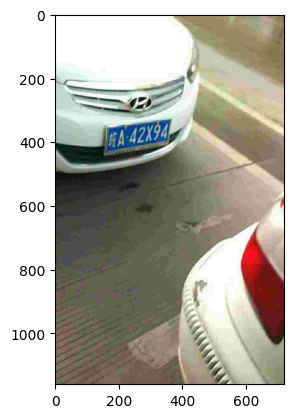

In [ ]:
list_images_names = os.listdir('/content/content/dataset/CCPD2019/ccpd_base')
image_example = list_images_names[30]
img = Image.open(os.path.join('/content/content/dataset/CCPD2019/ccpd_base', image_example))
plt.imshow(img)

print(image_example)
print(image_example.split('-')[4])

def extract_license_plate(filename):
    # Characters map
    provinces = ["皖", "沪", "津", "渝", "冀", "晋", "蒙", "辽", "吉", "黑", "苏", "浙", "京", "闽", "赣", "鲁", "豫", "鄂", "湘", "粤", "桂",
                "琼", "川", "贵", "云", "藏", "陕", "甘", "青", "宁", "新", "警", "学", "O"]
    alphabets = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'J', 'K', 'L', 'M', 'N', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W',
                'X', 'Y', 'Z', 'O']
    ads = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'J', 'K', 'L', 'M', 'N', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X',
          'Y', 'Z', '0', '1', '2', '3', '4', '5', '6', '7', '8', '9', 'O']

    parts = filename.split('-')
    if len(parts) < 5:
        return "Invalid filename format"

    lp_encoded = parts[4]
    char_codes = lp_encoded.split('_')

    if len(char_codes) != 7:
        return "Invalid license plate code format"

    province = provinces[int(char_codes[0])]
    letter = alphabets[int(char_codes[1])]
    char1 = ads[int(char_codes[2])]
    char2 = ads[int(char_codes[3])]
    char3 = ads[int(char_codes[4])]
    char4 = ads[int(char_codes[5])]
    char5 = ads[int(char_codes[6])]

    license_plate = province + letter + char1 + char2 + char3 + char4 + char5

    license_plate = license_plate.replace('O', '')

    return license_plate

def encode_license_plate(license_plate):
    provinces = ["皖", "沪", "津", "渝", "冀", "晋", "蒙", "辽", "吉", "黑", "苏", "浙", "京", "闽", "赣", "鲁", "豫", "鄂", "湘", "粤", "桂",
                "琼", "川", "贵", "云", "藏", "陕", "甘", "青", "宁", "新", "警", "学", "O"]
    alphabets = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'J', 'K', 'L', 'M', 'N', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W',
                'X', 'Y', 'Z', 'O']
    ads = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'J', 'K', 'L', 'M', 'N', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X',
          'Y', 'Z', '0', '1', '2', '3', '4', '5', '6', '7', '8', '9', 'O']

    province_to_index = {char: i for i, char in enumerate(provinces)}
    alphabet_to_index = {char: i for i, char in enumerate(alphabets)}
    ad_to_index = {char: i for i, char in enumerate(ads)}

    while len(license_plate) < 7:
        license_plate += 'O'

    # Ensure license plate is not longer than 7 characters
    if len(license_plate) > 7:
        print("Warning: License plate string is longer than 7 characters. Using the first 7.")
        license_plate = license_plate[:7]

    encoded_parts = []

    try:
        # Encode province
        encoded_parts.append(str(province_to_index[license_plate[0]]))

        # Encode second character (alphabet)
        encoded_parts.append(str(alphabet_to_index[license_plate[1]]))

        # Encode remaining 5 characters (ads)
        for char in license_plate[2:]:
            encoded_parts.append(str(ad_to_index[char]))

    except KeyError as e:
        return f"Error: Character '{e}' not found in mappings."
    except IndexError:
        return "Error: License plate string is too short after padding."

    return '_'.join(encoded_parts)

lp_number = extract_license_plate(image_example)
print(lp_number)
print(encode_license_plate(lp_number))
print('Correct' if image_example.split('-')[4] == encode_license_plate(lp_number) else 'Wrong')

# Recognition first baseline - Tesseract and EasyOcr

First test of recogniction using pretrained models without finetuning

In [ ]:
# Percorsi
img_root = '/content/content/dataset/CCPD2019/ccpd_base'
output_csv = '/content/predicted_boxes.csv'
max_samples = 500

# load model
model = SimpleCNNDetector()
model.load_state_dict(torch.load('/content/best_detector_model.pt'))
model.eval().cuda()


# image transforms
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

results = []
all_files = [f for f in os.listdir(img_root) if f.endswith('.jpg')]
all_files = all_files[:max_samples]

for fname in tqdm(all_files):
    try:
        img_path = os.path.join(img_root, fname)
        img = Image.open(img_path).convert('RGB')
        input_tensor = transform(img).unsqueeze(0).cuda()  # (1, 3, H, W)

        with torch.no_grad():
            output = model(input_tensor)


        if isinstance(output, tuple):
            output = output[0]

        preds = output.squeeze().detach().cpu().numpy()  # (4,)

        width, height = img.size
        pred_xmin = int(preds[0] * width)
        pred_ymin = int(preds[1] * height)
        pred_xmax = int(preds[2] * width)
        pred_ymax = int(preds[3] * height)

        results.append({
            'fname': fname,
            'pred_xmin': pred_xmin,
            'pred_ymin': pred_ymin,
            'pred_xmax': pred_xmax,
            'pred_ymax': pred_ymax
        })

    except Exception as e:
        print(f"Errore con {fname}: {e}")

# CSV save
df = pd.DataFrame(results)
df.to_csv(output_csv, index=False)
print(f"Predizioni salvate in {output_csv}")


100%|██████████| 500/500 [00:08<00:00, 60.63it/s]

Predizioni salvate in /content/predicted_boxes.csv


In [ ]:
def parse_bbox_from_filename(filename):
    try:
        parts = filename.split('-')
        if len(parts) < 4:
            raise ValueError("Invalid filename structure")

        bbox_part = parts[2]
        coords = bbox_part.split('_')
        x_values = []
        y_values = []
        for coord in coords:
            x, y = map(int, coord.split('&'))
            x_values.append(x)
            y_values.append(y)

        x_min = min(x_values)
        y_min = min(y_values)
        x_max = max(x_values)
        y_max = max(y_values)

        return x_min, y_min, x_max, y_max
    except Exception as e:
        print(f"Error parsing bbox from {filename}: {e}")
        return None


def extract_license_plate(filename):
    provinces = ["皖", "沪", "津", "渝", "冀", "晋", "蒙", "辽", "吉", "黑", "苏", "浙", "京", "闽", "赣", "鲁", "豫", "鄂", "湘", "粤", "桂",
                "琼", "川", "贵", "云", "藏", "陕", "甘", "青", "宁", "新", "警", "学", "O"]
    alphabets = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'J', 'K', 'L', 'M', 'N', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W',
                'X', 'Y', 'Z', 'O']
    ads = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'J', 'K', 'L', 'M', 'N', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X',
          'Y', 'Z', '0', '1', '2', '3', '4', '5', '6', '7', '8', '9', 'O']

    parts = filename.split('-')
    if len(parts) < 5:
        return "Invalid filename format"

    lp_encoded = parts[4]
    char_codes = lp_encoded.split('_')

    if len(char_codes) != 7:
        return "Invalid license plate code format"

    province = provinces[int(char_codes[0])]
    letter = alphabets[int(char_codes[1])]
    char1 = ads[int(char_codes[2])]
    char2 = ads[int(char_codes[3])]
    char3 = ads[int(char_codes[4])]
    char4 = ads[int(char_codes[5])]
    char5 = ads[int(char_codes[6])]

    license_plate = province + letter + char1 + char2 + char3 + char4 + char5

    license_plate = license_plate.replace('O', '')

    return license_plate


def preprocess_for_ocr(pil_img):
    img_cv = np.array(pil_img)
    img_gray = cv2.cvtColor(img_cv, cv2.COLOR_RGB2GRAY)

    img_gray = cv2.resize(img_gray, (img_gray.shape[1]*2, img_gray.shape[0]*2), interpolation=cv2.INTER_CUBIC)

    img_eq = cv2.equalizeHist(img_gray)

    img_bin = cv2.adaptiveThreshold(img_eq, 255,
                                    cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                    cv2.THRESH_BINARY, 11, 2)
    img_bin = cv2.medianBlur(img_bin, 3)

    return Image.fromarray(img_bin)



def clean_plate_text(text):
    valid_chars = set(
        "皖沪津渝冀晋蒙辽吉黑苏浙京闽赣鲁豫鄂湘粤桂琼川贵云藏陕甘青宁新警学"
        "ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789")
    cleaned = ''.join([c for c in text if c in valid_chars])
    return cleaned


# Config
img_root = '/content/content/dataset/CCPD2019/ccpd_base'
crop_output_dir = '/content/cropped_plates'
predictions_csv = '/content/predicted_boxes.csv'
output_csv = '/content/final_plate_recognition_results.csv'
max_samples = 500
os.makedirs(crop_output_dir, exist_ok=True)

df_pred = pd.read_csv(predictions_csv)
df_pred = df_pred.head(max_samples)

# Output
results = []

for i, row in tqdm(df_pred.iterrows(), total=len(df_pred)):
    fname = row['fname']
    img_path = os.path.join(img_root, fname)

    if not os.path.exists(img_path):
        continue

    try:
        # Bounding box GT (dal filename)
        bbox_gt = parse_bbox_from_filename(fname)
        if bbox_gt is None:
            continue
        x_gt_min, y_gt_min, x_gt_max, y_gt_max = bbox_gt

        # Bounding box predetta
        x_pred_min = int(row['pred_xmin'])
        y_pred_min = int(row['pred_ymin'])
        x_pred_max = int(row['pred_xmax'])
        y_pred_max = int(row['pred_ymax'])

        # Cropping targa predetta
        img = Image.open(img_path).convert('RGB')
        cropped = img.crop((x_pred_min, y_pred_min, x_pred_max, y_pred_max))

        # Preprocess per OCR
        cropped_preprocessed = preprocess_for_ocr(cropped)

        # OCR con Tesseract
        text_pred_raw = pytesseract.image_to_string(cropped_preprocessed, config='--psm 7 -c tessedit_char_whitelist=皖沪津渝冀晋蒙辽吉黑苏浙京闽赣鲁豫鄂湘粤桂琼川贵云藏陕甘青宁新警学OA-Z0-9')
        '''text_pred = clean_plate_text(text_pred_raw)'''
        text_pred = text_pred_raw

        '''# Se OCR non produce 7 caratteri validi, considera None
        if len(text_pred) != 7:
            text_pred = None'''

        # Targa GT (dal filename)
        plate_gt = extract_license_plate(fname)

        results.append({
            'fname': fname,
            'x_gt_min': x_gt_min,
            'y_gt_min': y_gt_min,
            'x_gt_max': x_gt_max,
            'y_gt_max': y_gt_max,
            'x_pred_min': x_pred_min,
            'y_pred_min': y_pred_min,
            'x_pred_max': x_pred_max,
            'y_pred_max': y_pred_max,
            'plate_text_gt': plate_gt,
            'plate_text_pred': text_pred
        })

        # Salva il crop per controllo
        cropped_path = os.path.join(crop_output_dir, fname)
        cropped.save(cropped_path)

    except Exception as e:
        print(f"Error processing {fname}: {e}")

# save CSV final
df_out = pd.DataFrame(results)
df_out.to_csv(output_csv, index=False)
print(f"Salvato in {output_csv}")



# Initialize EasyOCR for cinese + inglese
reader = easyocr.Reader(['ch_sim','en'], gpu=True)

# Fn OCR via EasyOCR
def ocr_easy(img_pil):
    img = np.array(img_pil)
    results = reader.readtext(img, detail=0)
    return ''.join(results).strip().upper()

# Add columns with yolo pred
df_out['plate_text_easy'] = None
for idx, row in tqdm(df_out.iterrows(), total=len(df_out)):
    fname = row['fname']
    crop_path = os.path.join(crop_output_dir, fname)
    if os.path.exists(crop_path):
        img = Image.open(crop_path)
        df_out.at[idx, 'plate_text_easy'] = ocr_easy(img)

df_out.to_csv(output_csv, index=False)
print(f"Salvato in {output_csv}")

 38%|███▊      | 189/500 [00:28<00:41,  7.50it/s]

Error processing 0389415708812-90_88-84&457_442&588-447&585_87&582_84&455_444&458-0_0_12_27_12_33_32-180-76.jpg: Coordinate 'right' is less than 'left'


 48%|████▊     | 239/500 [00:38<00:30,  8.48it/s]

Error processing 0386733716476-93_83-62&453_388&570-398&567_75&540_61&447_384&474-0_0_8_25_24_32_7-76-136.jpg: Coordinate 'right' is less than 'left'


 51%|█████     | 253/500 [00:40<00:27,  9.04it/s]

Error processing 0173060344828-91_80-78&499_310&596-328&596_90&586_74&502_312&512-0_6_1_27_24_33_33-145-50.jpg: Coordinate 'right' is less than 'left'


 51%|█████     | 256/500 [00:40<00:23, 10.26it/s]

Error processing 0280603448276-89_93-81&543_341&641-345&630_92&645_104&540_357&525-0_0_24_32_24_33_31-124-80.jpg: Coordinate 'right' is less than 'left'


 98%|█████████▊| 492/500 [01:16<00:00,  9.14it/s]

Error processing 0111637931034-85_97-178&443_351&517-354&498_197&521_203&465_360&442-0_0_33_32_32_25_28-103-13.jpg: Coordinate 'right' is less than 'left'


100%|██████████| 500/500 [01:17<00:00,  6.42it/s]


Salvato in /content/final_plate_recognition_results.csv


100%|██████████| 495/495 [00:19<00:00, 25.78it/s]

Salvato in /content/final_plate_recognition_results.csv


/tmp/ipython-input-22-308143779.py:31: UserWarning: Glyph 30358 (\N{CJK UNIFIED IDEOGRAPH-7696}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-22-308143779.py:31: UserWarning: Glyph 12 () missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 30358 (\N{CJK UNIFIED IDEOGRAPH-7696}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12 () missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


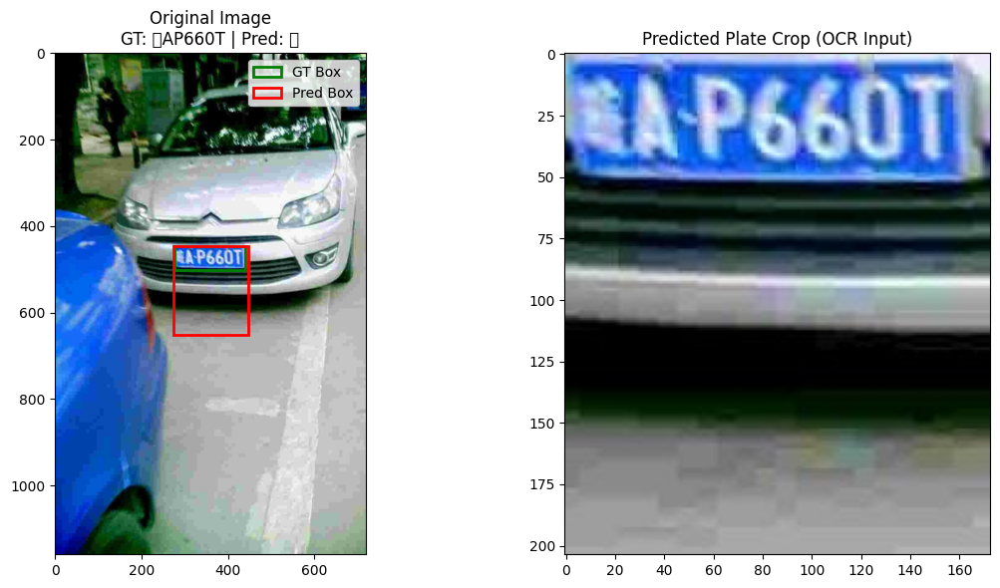

In [ ]:

example_row = df_out.iloc[30]
img = Image.open(os.path.join(img_root, example_row['fname']))

fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Subplot 1: immagine originale con bbox
ax[0].imshow(img)
ax[0].set_title(f"Original Image\nGT: {example_row['plate_text_gt']} | Pred: {example_row['plate_text_pred']}")
gt_box = patches.Rectangle(
    (example_row['x_gt_min'], example_row['y_gt_min']),
    example_row['x_gt_max'] - example_row['x_gt_min'],
    example_row['y_gt_max'] - example_row['y_gt_min'],
    linewidth=2, edgecolor='green', facecolor='none', label='GT Box'
)
pred_box = patches.Rectangle(
    (example_row['x_pred_min'], example_row['y_pred_min']),
    example_row['x_pred_max'] - example_row['x_pred_min'],
    example_row['y_pred_max'] - example_row['y_pred_min'],
    linewidth=2, edgecolor='red', facecolor='none', label='Pred Box'
)
ax[0].add_patch(gt_box)
ax[0].add_patch(pred_box)
ax[0].legend()

# Subplot 2: immagine croppata della targa
cropped_img = Image.open(os.path.join(crop_output_dir, example_row['fname']))
ax[1].imshow(cropped_img)
ax[1].set_title("Predicted Plate Crop (OCR Input)")

plt.tight_layout()
plt.show()

In [ ]:
# Postprocessing
def postprocess_plate(text):
    if not isinstance(text, str): return ""
    corrections = {'O':'0','I':'1'}
    return ''.join(corrections.get(c, c) for c in text.strip().upper())

df_out['pred_clean'] = df_out['plate_text_pred'].fillna('').apply(clean_plate_text)
df_out['pred_post'] = df_out['pred_clean'].apply(postprocess_plate)
df_out['easy_clean'] = df_out['plate_text_easy'].fillna('').apply(clean_plate_text)
df_out['easy_post'] = df_out['easy_clean'].apply(postprocess_plate)

df_out.to_csv(output_csv, index=False)
print(f"Salvato in {output_csv}")

valid = df_out[df_out['plate_text_gt'].notnull()]

def exact_match_rate(col):
    return (valid['plate_text_gt'] == valid[col]).mean()
def cer_rate(col):
    return cer(valid['plate_text_gt'].tolist(), valid[col].tolist())

metrics = {
    'Method': [],
    'Exact Match (%)': [],
    'CER (%)': []
}
for label in ['pred_clean','pred_post','easy_clean','easy_post']:
    metrics['Method'].append(label)
    metrics['Exact Match (%)'].append(exact_match_rate(label))
    metrics['CER (%)'].append(cer_rate(label))

import pandas as pd
metrics_df = pd.DataFrame(metrics)
print(metrics_df)
metrics_df.to_csv('baseline_metrics.csv', index=False)


Salvato in /content/final_plate_recognition_results.csv
       Method  Exact Match (%)   CER (%)
0  pred_clean          0.00000  0.993651
1   pred_post          0.00000  0.990765
2  easy_clean          0.00404  0.546320
3   easy_post          0.00404  0.525253


## Correct predictions with easyOCR

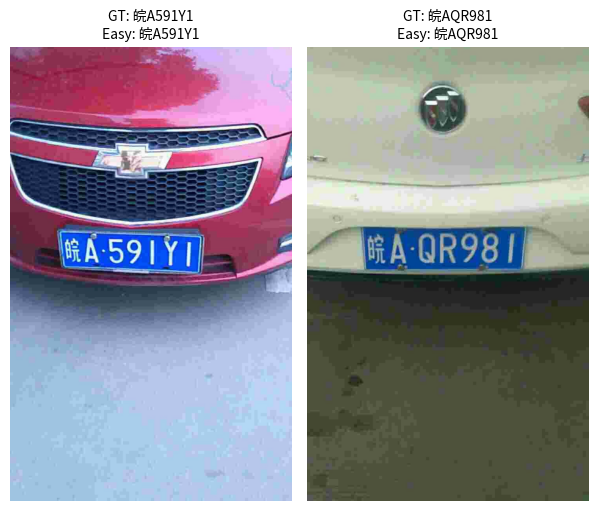

In [ ]:
csv_path = '/content/final_plate_recognition_results.csv'
img_root = '/content/content/dataset/CCPD2019/ccpd_base'

df = pd.read_csv(csv_path)
df.columns = df.columns.str.strip()  # Rimuove spazi dai nomi colonne

column_easy = 'easy_clean' if 'easy_clean' in df.columns else 'plate_text_easy'

df_correct = df[df[column_easy] == df['plate_text_gt']]

df_sample = df_correct.head(5)

font_path = "/usr/share/fonts/opentype/noto/NotoSansCJK-Regular.ttc"
font_prop = fm.FontProperties(fname=font_path)

# Plot
plt.figure(figsize=(15, 6))
for i, (_, row) in enumerate(df_sample.iterrows()):
    img_path = os.path.join(img_root, row['fname'])
    img = Image.open(img_path)

    plt.subplot(1, 5, i + 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"GT: {row['plate_text_gt']}\nEasy: {row[column_easy]}", fontproperties=font_prop)

plt.tight_layout()
plt.show()


In [ ]:
df_correct

,fname,x_gt_min,y_gt_min,x_gt_max,y_gt_max,x_pred_min,y_pred_min,x_pred_max,y_pred_max,plate_text_gt,plate_text_pred,plate_text_easy,pred_clean,pred_post,easy_clean,easy_post
259,0379166666667-91_84-118&463_489&585-496&582_13...,118,463,489,585,125,429,502,572,皖A591Y1,eel oS Se |\n,皖A:591Y1,SS,55,皖A591Y1,皖4591Y1
469,0493295019157-90_89-144&455_568&581-565&578_14...,144,455,568,581,112,453,579,593,皖AQR981,,皖A.QR98 1,NaN,NaN,皖AQR981,皖40R981


# Recognition - Holistic CNN

## Dataset class and model architecture

In [ ]:
# Charset CCPD
provinces = list("皖沪津渝冀晋蒙辽吉黑苏浙京闽赣鲁豫鄂湘粤桂琼川贵云藏陕甘青宁新警学")
alphabets = list("ABCDEFGHJKLMNPQRSTUVWXYZ")
ads = list("ABCDEFGHJKLMNPQRSTUVWXYZ0123456789")

charsets = [provinces, alphabets] + [ads]*5
char_to_idx = [{c: i for i, c in enumerate(charset)} for charset in charsets]

def encode_plate(plate):
    return [char_to_idx[i].get(c, 0) for i, c in enumerate(plate)]

class PlateCropDataset(Dataset):
    def __init__(self, csv_file, image_dir, transform=None):
        self.df = pd.read_csv(csv_file)
        self.image_dir = image_dir
        self.transform = transform or transforms.Compose([
            transforms.Resize((64, 160)),
            transforms.ToTensor()
        ])

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        image_path = os.path.join(self.image_dir, row['filename'])
        image = Image.open(image_path).convert('RGB')
        label = torch.tensor(encode_plate(row['plate']), dtype=torch.long)
        image = self.transform(image)
        return image, label


In [ ]:
import torch.nn as nn

class HolisticCNN(nn.Module):
    def __init__(self, num_provinces=34, num_alphabets=25, num_ads=34):
        super().__init__()
        self.backbone = nn.Sequential(
            nn.Conv2d(3, 32, 3, stride=1, padding=1),  # (64,160)
            nn.ReLU(),
            nn.MaxPool2d(2),  # (32,80)
            nn.Conv2d(32, 64, 3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),  # (16,40)
            nn.Conv2d(64, 128, 3, stride=1, padding=1),
            nn.ReLU(),
            nn.AdaptiveAvgPool2d((1, 1)),
        )
        self.flatten = nn.Flatten()
        self.shared = nn.Linear(128, 128)
        self.heads = nn.ModuleList([
            nn.Linear(128, num_provinces),
            nn.Linear(128, num_alphabets),
            *[nn.Linear(128, num_ads) for _ in range(5)]
        ])

    def forward(self, x):
        x = self.backbone(x)
        x = self.flatten(x)
        x = self.shared(x)
        return [head(x) for head in self.heads]


## Training and evaluation

In [ ]:
load_model_state = True

def compute_loss(preds, labels, criterion):
    return sum(criterion(p, labels[:, i]) for i, p in enumerate(preds))

def accuracy(preds, labels):
    total = labels.shape[0]
    correct_seq = torch.ones(total, dtype=torch.bool, device=labels.device)
    correct_chars = 0
    for i, p in enumerate(preds):
        pred_idx = p.argmax(dim=1)
        correct_seq &= (pred_idx == labels[:, i])
        correct_chars += (pred_idx == labels[:, i]).sum().item()
    return correct_seq.sum().item() / total, correct_chars / (total * 7)

# Dataset
full_dataset = PlateCropDataset('/content/yolo_crops_labels.csv', '/content/yolo_crops')
train_size = int(0.8 * len(full_dataset))
val_size = len(full_dataset) - train_size
train_ds, val_ds = random_split(full_dataset, [train_size, val_size])

train_loader = DataLoader(train_ds, batch_size=64, shuffle=True)
val_loader = DataLoader(val_ds, batch_size=64)

# Training
model = HolisticCNN().cuda()
if load_model_state:
    model.load_state_dict(torch.load('best_holistic_cnn.pt'))
    print("✅ Model loaded.")
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
criterion = nn.CrossEntropyLoss()

#  early stopping
patience = 5
epochs = 100
best_val_acc = 0
epochs_no_improve = 0
best_model_state = None

for epoch in range(epochs):
    model.train()
    for images, labels in train_loader:
        images, labels = images.cuda(), labels.cuda()
        preds = model(images)
        loss = compute_loss(preds, labels, criterion)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    # Validation
    model.eval()
    total_loss, total_acc, total_char = 0, 0, 0
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.cuda(), labels.cuda()
            preds = model(images)
            loss = compute_loss(preds, labels, criterion)
            acc, char_acc = accuracy(preds, labels)

            total_loss += loss.item()
            total_acc += acc
            total_char += char_acc

    val_loss = total_loss / len(val_loader)
    val_seq_acc = total_acc / len(val_loader)
    val_char_acc = total_char / len(val_loader)

    print(f"[{epoch+1:02d}/{epochs}] Val Loss: {val_loss:.4f} | Seq Acc: {val_seq_acc:.4f} | Char Acc: {val_char_acc:.4f}")

    # Early stopping
    if val_char_acc > best_val_acc:
        best_val_acc = val_char_acc
        best_model_state = copy.deepcopy(model.state_dict())
        epochs_no_improve = 0
        print("✅ Model improved. Saving checkpoint.")
        torch.save(best_model_state, "best_holistic_cnn.pt")
    else:
        epochs_no_improve += 1
        print(f"⚠️ No improvement for {epochs_no_improve} epoch(s).")

    if epochs_no_improve >= patience:
        print("⛔ Early stopping triggered.")
        break


✅ Model loaded.
[01/100] Val Loss: 3.6319 | Seq Acc: 0.2418 | Char Acc: 0.8292
✅ Model improved. Saving checkpoint.
[02/100] Val Loss: 3.6441 | Seq Acc: 0.2386 | Char Acc: 0.8285
⚠️ No improvement for 1 epoch(s).
[03/100] Val Loss: 3.6699 | Seq Acc: 0.2309 | Char Acc: 0.8261
⚠️ No improvement for 2 epoch(s).
[04/100] Val Loss: 3.6644 | Seq Acc: 0.2336 | Char Acc: 0.8263
⚠️ No improvement for 3 epoch(s).
[05/100] Val Loss: 3.6753 | Seq Acc: 0.2348 | Char Acc: 0.8264
⚠️ No improvement for 4 epoch(s).
[06/100] Val Loss: 3.6872 | Seq Acc: 0.2316 | Char Acc: 0.8250
⚠️ No improvement for 5 epoch(s).
⛔ Early stopping triggered.


# Recognition - LPRNet

##Dataset initialization

### inizialization of label classes, definition of blank character for CTC decoding, character list used for ground truth

In [ ]:

from collections import OrderedDict

PROVINCES = ["皖", "沪", "津", "渝", "冀", "晋", "蒙", "辽", "吉", "黑", "苏", "浙", "京", "闽", "赣",
             "鲁", "豫", "鄂", "湘", "粤", "桂", "琼", "川", "贵", "云", "藏", "陕", "甘", "青", "宁",
             "新", "警", "学"]
ADS = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'J', 'K',
       'L', 'M', 'N', 'P', 'Q', 'R', 'S', 'T', 'U', 'V',
       'W', 'X', 'Y', 'Z', '0', '1', '2', '3', '4', '5',
       '6', '7', '8', '9']

# ✔ CHARS for classes, no duplicates
CHARS = list(OrderedDict.fromkeys(PROVINCES + ADS))
CHARS.append("-")  # blank for CTC

char2idx = {c: i for i, c in enumerate(CHARS)}
idx2char = {i: c for i, c in enumerate(CHARS)}
print(char2idx, idx2char)


{'皖': 0, '沪': 1, '津': 2, '渝': 3, '冀': 4, '晋': 5, '蒙': 6, '辽': 7, '吉': 8, '黑': 9, '苏': 10, '浙': 11, '京': 12, '闽': 13, '赣': 14, '鲁': 15, '豫': 16, '鄂': 17, '湘': 18, '粤': 19, '桂': 20, '琼': 21, '川': 22, '贵': 23, '云': 24, '藏': 25, '陕': 26, '甘': 27, '青': 28, '宁': 29, '新': 30, '警': 31, '学': 32, 'A': 33, 'B': 34, 'C': 35, 'D': 36, 'E': 37, 'F': 38, 'G': 39, 'H': 40, 'J': 41, 'K': 42, 'L': 43, 'M': 44, 'N': 45, 'P': 46, 'Q': 47, 'R': 48, 'S': 49, 'T': 50, 'U': 51, 'V': 52, 'W': 53, 'X': 54, 'Y': 55, 'Z': 56, '0': 57, '1': 58, '2': 59, '3': 60, '4': 61, '5': 62, '6': 63, '7': 64, '8': 65, '9': 66, '-': 67} {0: '皖', 1: '沪', 2: '津', 3: '渝', 4: '冀', 5: '晋', 6: '蒙', 7: '辽', 8: '吉', 9: '黑', 10: '苏', 11: '浙', 12: '京', 13: '闽', 14: '赣', 15: '鲁', 16: '豫', 17: '鄂', 18: '湘', 19: '粤', 20: '桂', 21: '琼', 22: '川', 23: '贵', 24: '云', 25: '藏', 26: '陕', 27: '甘', 28: '青', 29: '宁', 30: '新', 31: '警', 32: '学', 33: 'A', 34: 'B', 35: 'C', 36: 'D', 37: 'E', 38: 'F', 39: 'G', 40: 'H', 41: 'J', 42: 'K', 43: 'L', 44: 'M', 4

In [ ]:
idx=len(CHARS)-1
CHARS[idx]

'-'

In [ ]:
# CCPD original index mapping. With duplicates, usefull for extracting labels from filenames

provinces_ccpd = ["皖", "沪", "津", "渝", "冀", "晋", "蒙", "辽", "吉", "黑", "苏", "浙", "京", "闽", "赣",
                  "鲁", "豫", "鄂", "湘", "粤", "桂", "琼", "川", "贵", "云", "藏", "陕", "甘", "青", "宁",
                  "新", "警", "学"]
alphabets_ccpd = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'J', 'K',
                  'L', 'M', 'N', 'P', 'Q', 'R', 'S', 'T', 'U', 'V',
                  'W', 'X', 'Y', 'Z']

ads_ccpd = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'J', 'K',
            'L', 'M', 'N', 'P', 'Q', 'R', 'S', 'T', 'U', 'V',
            'W', 'X', 'Y', 'Z', '0', '1', '2', '3', '4', '5',
            '6', '7', '8', '9']



## Model architecture

In [ ]:
#Convolutions for feature extraction
class SmallBasicBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(SmallBasicBlock, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, 1, 1, 0)
        self.conv2 = nn.Conv2d(out_channels, out_channels, 3, 1, 1)
        self.conv3 = nn.Conv2d(out_channels, out_channels, 1, 1, 0)
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        return self.relu(self.conv3(self.relu(self.conv2(self.relu(self.conv1(x))))))

class LPRNet(nn.Module):
    def __init__(self, num_classes=98):
        super(LPRNet, self).__init__()
        self.backbone = nn.Sequential(
            nn.Conv2d(3, 64, 3, stride=1, padding=1),  # [B, 64, H, W]
            nn.BatchNorm2d(64), nn.ReLU(inplace=True),
            nn.MaxPool2d(3, stride=1),  # [B, 64, H-2, W-2]
            SmallBasicBlock(64, 128),
            nn.MaxPool2d(3, stride=2),  # [B, 128, H', W']
            SmallBasicBlock(128, 256),
            nn.MaxPool2d(3, stride=2),
            SmallBasicBlock(256, 256),
            nn.Conv2d(256, 256, 3, padding=1),
            nn.BatchNorm2d(256), nn.ReLU(inplace=True),
        )
        #Global context to capture horizontal information
        self.global_context = nn.Sequential(
            nn.Conv2d(256, 256, kernel_size=(4, 1)),  # global height pooling
            nn.BatchNorm2d(256), nn.ReLU(inplace=True)
        )
        #Convolution 1x1 used to classify a character at each spatial column, interpreted as a time step
        self.classifier = nn.Sequential(
            nn.Conv2d(512, num_classes, 1)
        )

    def forward(self, x):
        feat = self.backbone(x)
        context = self.global_context(feat)  # [B, 256, 1, W]
        context = context.expand(-1, -1, feat.size(2), -1)  # [B, 256, H, W] expand copies the context value on the entire height for each column
        concat = torch.cat([feat, context], dim=1) # concatenate [B, 512, H, W]

        logits = self.classifier(concat)  # [B, num_classes, H, W]

        # Ensure height (H)=1 otherwise apply average pooling along the height dimension
        # Resulting shape: [B, C, W] then permuted to [B, W, C] for decoding
        logits = torch.mean(logits, dim=2)
        logits = logits.permute(0, 2, 1)
        return logits


In [ ]:
# finds correct blank index
blank_idx = char2idx['-']
print(f"Blank index: {blank_idx}")
print(f"len(CHARS)={len(CHARS)}")

def ctc_decode(logits, blank_idx=blank_idx):

    pred_indices = torch.argmax(logits, dim=2)  # [B, T]
    pred_strings = []

    for seq in pred_indices:
        prev = -1
        decoded = []
        for idx in seq:
            idx = idx.item()
            if idx != prev and idx != blank_idx:
                decoded.append(idx)
            prev = idx
        decoded_str = ''.join([idx2char[i] for i in decoded])
        pred_strings.append(decoded_str)

    return pred_strings if len(pred_strings) > 1 else pred_strings[0]



Blank index: 67
len(CHARS)=68


In [ ]:
transform = transforms.Compose([
    transforms.Resize((24, 94)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5], std=[0.5])
])


## Dataset split

In [ ]:
#crops the images with IoU>0.6
def crop_from_csv(
    csv_path,
    image_base_dir,
    image_category,
    output_dir,
    iou_threshold=0.6
):
    os.makedirs(output_dir, exist_ok=True)

    df = pd.read_csv(csv_path)
    df = df[df['iou'] >= iou_threshold]

    category_path = os.path.join(image_base_dir, image_category)

    for _, row in tqdm(df.iterrows(), total=len(df), desc=f"Cropping {image_category}"):
        filename = row['file']
        img_path = os.path.join(category_path, filename)
        if not os.path.exists(img_path):
            print(f"[!] Immagine mancante: {img_path}")
            continue

        x1, y1, x2, y2 = map(int, [row['pred_xmin'], row['pred_ymin'], row['pred_xmax'], row['pred_ymax']])
        img = cv2.imread(img_path)
        crop = img[y1:y2, x1:x2]

        if crop.size == 0:
            continue

        save_path = os.path.join(output_dir, filename)
        cv2.imwrite(save_path, crop)

    print(f"\n✅ Completato salvataggio dei crop in: {output_dir}")


In [ ]:
def extract_label_from_filename(filename):
    try:
        parts = filename.split('-')
        code = list(map(int, parts[4].split('_')))
        if len(code) != 7:
            raise ValueError("Etichetta non lunga 7 simboli")

        province = provinces_ccpd[code[0]]
        alpha = alphabets_ccpd[code[1]]
        ads = [ads_ccpd[i] for i in code[2:]]
        return [province, alpha] + ads
    except Exception as e:
        print(f"[Errore]: {filename} → {e}")
        return None



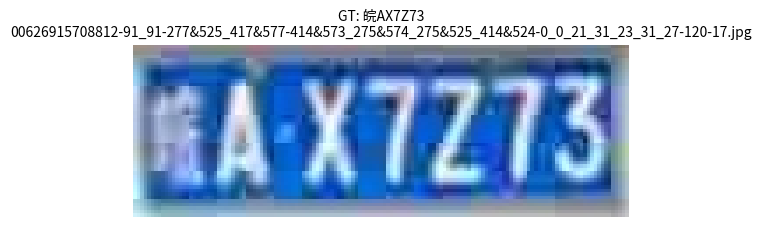

00626915708812-91_91-277&525_417&577-414&573_275&574_275&525_414&524-0_0_21_31_23_31_27-120-17.jpg


In [ ]:
import matplotlib.pyplot as plt
import random
import os
import cv2


img_dir = '/content/content/cropped_plates_base'

# Check if the directory exists
if not os.path.exists(img_dir):
    print(f"Error: Directory not found at {img_dir}")
else:
    img_files = [f for f in os.listdir(img_dir) if f.endswith('.jpg')]

    # Check if there are any image files
    if not img_files:
        print(f"Error: No .jpg files found in {img_dir}")
    else:
        # Select one random image
        filename = random.choice(img_files)
        img_path = os.path.join(img_dir, filename)

        img = cv2.imread(img_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)


        label_chars = extract_label_from_filename(filename)
        label_str = ''.join(label_chars)

        # Plot image with label
        plt.imshow(img_rgb)
        plt.title(f"GT: {label_str}\n{filename}", fontproperties= font_prop)
        plt.axis('off')
        plt.show()

        print(filename)

In [ ]:
from PIL import Image

class LPRDataset(torch.utils.data.Dataset):
    def __init__(self, img_dir, transform=None, img_files=None):
        self.img_dir = img_dir
        self.transform = transform

        if img_files:
            self.img_files = img_files
        else:
            self.img_files = [f for f in os.listdir(img_dir) if f.endswith('.jpg')]


    def __len__(self):
        return len(self.img_files)

    def __getitem__(self, idx):
        filename = self.img_files[idx]
        img_path = os.path.join(self.img_dir, filename)
        img = cv2.imread(img_path) # Numpy array
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # Numpy array RGB
        img = Image.fromarray(img)  # Conversion

        # Resize + normalizzation
        if self.transform:
            img = self.transform(img)
        else:
            img = transforms.ToTensor()(img)
        #label extraction
        label_chars = extract_label_from_filename(filename)
        label_indices = [char2idx[c] for c in label_chars]
        label_tensor = torch.tensor(label_indices, dtype=torch.long)

        return img, label_tensor, len(label_tensor) #lenght is for the CTC Loss


In [ ]:
img_dir = "/content/content/cropped_plates_base"

# Total images
all_imgs = [f for f in os.listdir(img_dir) if f.endswith('.jpg')]
all_imgs.sort()  # Ordine deterministico
print(f"Totale immagini: {len(all_imgs)}")

# Split 80% trainval, 20% test
trainval_imgs, test_imgs = train_test_split(all_imgs, test_size=0.2, random_state=42)
train_imgs, val_imgs = train_test_split(trainval_imgs, test_size=0.2, random_state=42)

split_dir = "/content/drive/MyDrive/computerVisionProject/splits"
os.makedirs(split_dir, exist_ok=True)

with open(os.path.join(split_dir, "train_imgs.json"), "w") as f:
    json.dump(train_imgs, f)
with open(os.path.join(split_dir, "val_imgs.json"), "w") as f:
    json.dump(val_imgs, f)
with open(os.path.join(split_dir, "test_imgs.json"), "w") as f:
    json.dump(test_imgs, f)

print("✅ Split salvati su Google Drive.")


Totale immagini: 199970
✅ Split salvati su Google Drive.


In [ ]:
with open("/content/drive/MyDrive/computerVisionProject/splits/train_imgs.json") as f:
    train_files = json.load(f)
with open("/content/drive/MyDrive/computerVisionProject/splits/val_imgs.json") as f:
    val_files = json.load(f)

# Dataset e dataloader
train_set = LPRDataset("/content/content/cropped_plates_base", transform=transform, img_files=train_files)
val_set = LPRDataset("/content/content/cropped_plates_base", transform=transform, img_files=val_files)

train_loader = DataLoader(train_set, batch_size=32, shuffle=True, collate_fn=lambda x: x)
val_loader = DataLoader(val_set, batch_size=32, shuffle=False, collate_fn=lambda x: x)


## Training and evaluation

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
model = LPRNet(num_classes=len(CHARS)).to(device)


In [ ]:
blank_idx = char2idx['-']

# CTC Loss
criterion = nn.CTCLoss(blank=blank_idx, zero_infinity=True)

In [ ]:
#ADAM OPTIMIZER
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)


In [ ]:
def train_one_epoch(model, dataloader, criterion, optimizer, device):
    model.train()
    epoch_loss = 0

    for batch in dataloader:
        imgs, labels, label_lengths = zip(*batch)
        imgs = torch.stack(imgs).to(device)
        targets = torch.cat(labels).to(device)
        target_lengths = torch.tensor(label_lengths, dtype=torch.long).to(device)

        # Compute predictions lenght
        batch_size = imgs.size(0)
        outputs = model(imgs)  # [B, T, C]
        log_probs = F.log_softmax(outputs, dim=2)  # CTC wants log(probability)

        input_lengths = torch.full(
            size=(batch_size,), fill_value=log_probs.size(1), dtype=torch.long
        ).to(device)

        # CTC Loss
        log_probs = log_probs.permute(1, 0, 2)  # [T, B, C]
        loss = criterion(log_probs, targets, input_lengths, target_lengths)

        # Backprop
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        epoch_loss += loss.item()

    return epoch_loss / len(dataloader)


In [ ]:
train_losses = []
val_losses = []
char_accuracies = []
sent_accuracies = []
best_sentence_acc = 0.0

device = "cuda" if torch.cuda.is_available() else "cpu"
num_epochs = 15

for epoch in range(num_epochs):
    loss = train_one_epoch(model, train_loader, criterion, optimizer, device)
    train_losses.append(loss)
    print(f"📘 Epoch {epoch+1}/{num_epochs}")
    print(f"📊Train Loss: {loss:.4f}")

     # Evaluate on validation set
    model.eval()
    val_loss = 0
    val_steps = 0
    with torch.no_grad():
        total_chars = 0
        correct_chars = 0
        total_sentences = 0
        correct_sentences = 0

        for batch in val_loader:
            imgs, labels, lengths = zip(*batch)
            imgs = torch.stack(imgs).to(device)
            targets = torch.cat(labels).to(device)

            outputs = model(imgs)
            log_probs = F.log_softmax(outputs, dim=2)
            input_lengths = torch.full((imgs.size(0),), log_probs.size(1), dtype=torch.long).to(device)

            log_probs = log_probs.permute(1, 0, 2)                         # [T, B, C] → for CTC
            loss = criterion(log_probs, targets, input_lengths, target_lengths)
            val_loss += loss.item()
            val_steps += 1

            #Decoding
            label_strs = [''.join([idx2char[int(i)] for i in l]) for l in labels]
            decoded_batch = ctc_decode(outputs, blank_idx)


            for pred_str, gt_str in zip(decoded_batch, label_strs):

                # character-level
                char_matches = sum(p == g for p, g in zip(pred_str, gt_str))
                correct_chars += char_matches
                total_chars += len(gt_str)

                # sentence-level
                if pred_str == gt_str:
                    correct_sentences += 1
                total_sentences += 1
                # verify
                if total_sentences < 5:
                    # primi 5 esempi
                    print(f"GT: '{gt_str}' | PRED: '{pred_str}' | Match: {pred_str == gt_str}")

        avg_val_loss = val_loss / val_steps
        val_losses.append(avg_val_loss)
        print(f"📊 Validation Loss: {avg_val_loss:.4f}")


        char_acc = correct_chars / total_chars * 100
        sent_acc = correct_sentences / total_sentences * 100
        char_accuracies.append(char_acc)
        sent_accuracies.append(sent_acc)

        print(f"🔠 Character Accuracy: {char_acc:.2f}%")
        print(f"📄 Sentence Accuracy: {sent_acc:.2f}%")

        # 🔝 Se migliora la sentence accuracy, stampalo
        if sent_acc > best_sentence_acc:
          best_sentence_acc = sent_acc
          print(f"🌟 Nuovo BEST Sentence Accuracy: {sent_acc:.2f}%, Val Loss: {avg_val_loss:.4f})")
          # 💾 Salva i pesi
          torch.save(model.state_dict(), "/content/best_lprnet_15_epochs.pt")
          print("📦 Salvato best modello in: /content/best_lprnet_15_epochs.pt")




📘 Epoch 1/15
📊Train Loss: 0.1993
GT: '皖LU7139' | PRED: '皖LU7139' | Match: True
GT: '皖ASR931' | PRED: '皖ASR931' | Match: True
GT: '皖AJU813' | PRED: '皖AJU813' | Match: True
GT: '皖A68T97' | PRED: '皖A68T97' | Match: True
📊 Validation Loss: 0.0204
🔠 Character Accuracy: 99.23%
📄 Sentence Accuracy: 96.53%
🌟 Nuovo BEST Sentence Accuracy: 96.53%, Val Loss: 0.0204)
📦 Salvato best modello in: /content/best_lprnet_100k_1epoch.pt
📘 Epoch 2/15
📊Train Loss: 0.0180
GT: '皖LU7139' | PRED: '皖LU7139' | Match: True
GT: '皖ASR931' | PRED: '皖ASR931' | Match: True
GT: '皖AJU813' | PRED: '皖AJU813' | Match: True
GT: '皖A68T97' | PRED: '皖A68T97' | Match: True
📊 Validation Loss: 0.0276
🔠 Character Accuracy: 98.82%
📄 Sentence Accuracy: 94.81%
📘 Epoch 3/15
📊Train Loss: 0.0120
GT: '皖LU7139' | PRED: '皖LU7139' | Match: True
GT: '皖ASR931' | PRED: '皖ASR931' | Match: True
GT: '皖AJU813' | PRED: '皖AJU813' | Match: True
GT: '皖A68T97' | PRED: '皖A68T97' | Match: True
📊 Validation Loss: 0.0122
🔠 Character Accuracy: 99.52%
📄 Sente

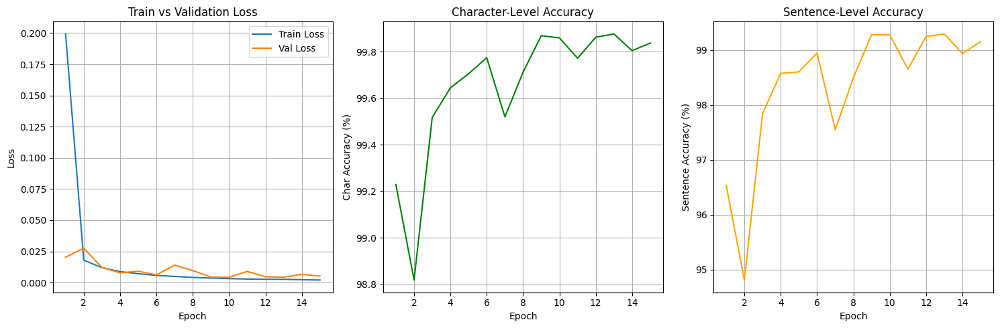

<Figure size 1500x500 with 0 Axes>

<Figure size 1500x500 with 0 Axes>

In [ ]:
epochs = list(range(1, num_epochs + 1))
plt.figure(figsize=(15, 5))

# 🔵 Loss plot
plt.subplot(1, 3, 1)
plt.plot(epochs, train_losses, label="Train Loss")
plt.plot(epochs, val_losses, label="Val Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Train vs Validation Loss")
plt.legend()
plt.grid(True)

# 🟢 Character Accuracy
plt.subplot(1, 3, 2)
plt.plot(epochs, char_accuracies, color="green")
plt.xlabel("Epoch")
plt.ylabel("Char Accuracy (%)")
plt.title("Character-Level Accuracy")
plt.grid(True)

# 🟠 Sentence Accuracy
plt.subplot(1, 3, 3)
plt.plot(epochs, sent_accuracies, color="orange")
plt.xlabel("Epoch")
plt.ylabel("Sentence Accuracy (%)")
plt.title("Sentence-Level Accuracy")
plt.grid(True)

plt.tight_layout()
plt.show()
epochs = list(range(1, num_epochs + 1))
plt.figure(figsize=(15, 5))




In [ ]:
def show_predictions_and_save_csv(model, dataset, device, num_samples=12, csv_path="/content/predictions.csv"):
    model.eval()
    data = []
    n = min(num_samples, len(dataset))

    indices = random.sample(range(len(dataset)), n)
    fig, axs = plt.subplots(3, 4, figsize=(16, 9))
    axs = axs.flatten()

    for i, idx in enumerate(indices):
        img, label_tensor, _ = dataset[idx]
        label_str = ''.join([idx2char[c.item()] for c in label_tensor])

        with torch.no_grad():
            input_tensor = img.unsqueeze(0).to(device)
            output = model(input_tensor)

            # Debug
            if i < 3:
                print(f"\n🔍 Esempio #{i+1} (idx={idx})")
                print(f"🔍 Input shape: {input_tensor.shape}")
                print(f"🔍 Output shape: {output.shape}")
                print(f"🔍 Label string: '{label_str}'")

                pred_indices = torch.argmax(output, dim=2)[0][:15]
                print(f"🔍 Raw predictions (primi 15): {pred_indices}")
                print(f"🔍 Raw predictions (caratteri): {[idx2char[int(x)] for x in pred_indices]}")

            pred_list = ctc_decode(output, blank_idx)

            if i < 3:
                print(f"🔍 pred_list type: {type(pred_list)}")
                print(f"🔍 pred_list value: {repr(pred_list)}")

            pred_str = pred_list[0] if isinstance(pred_list, list) else pred_list

            if i < 3:
                print(f"🔍 Final pred_str: '{pred_str}'")


        img_np = img.permute(1, 2, 0).cpu().numpy()
        img_np = (img_np * 0.5 + 0.5).clip(0, 1)

        color = "green" if pred_str == label_str else "red"
        axs[i].imshow(img_np)
        axs[i].set_title(f"GT: {label_str}\nPred: {pred_str}", color=color, fontsize=10, fontproperties=font_prop)
        axs[i].axis('off')

        data.append({
            "Index": idx,
            "Ground Truth": label_str,
            "Prediction": pred_str,
            "Correct": pred_str == label_str
        })

    plt.tight_layout()
    plt.show()

    df = pd.DataFrame(data)
    df.to_csv(csv_path, index=False)
    print(f"📄 CSV salvato in: {csv_path}")


🔍 Esempio #1 (idx=28616)
🔍 Input shape: torch.Size([1, 3, 24, 94])
🔍 Output shape: torch.Size([1, 22, 68])
🔍 Label string: '皖AJ0L59'
🔍 Raw predictions (primi 15): tensor([ 0, 67, 67, 67, 33, 33, 67, 67, 67, 41, 41, 67, 57, 57, 67],
       device='cuda:0')
🔍 Raw predictions (caratteri): ['皖', '-', '-', '-', 'A', 'A', '-', '-', '-', 'J', 'J', '-', '0', '0', '-']
🔍 pred_list type: <class 'str'>
🔍 pred_list value: '皖AJ0L59'
🔍 Final pred_str: '皖AJ0L59'

🔍 Esempio #2 (idx=3376)
🔍 Input shape: torch.Size([1, 3, 24, 94])
🔍 Output shape: torch.Size([1, 22, 68])
🔍 Label string: '皖A808Q7'
🔍 Raw predictions (primi 15): tensor([ 0, 67, 67, 67, 33, 33, 67, 67, 65, 65, 67, 67, 57, 67, 65],
       device='cuda:0')
🔍 Raw predictions (caratteri): ['皖', '-', '-', '-', 'A', 'A', '-', '-', '8', '8', '-', '-', '0', '-', '8']
🔍 pred_list type: <class 'str'>
🔍 pred_list value: '皖A808Q7'
🔍 Final pred_str: '皖A808Q7'

🔍 Esempio #3 (idx=27386)
🔍 Input shape: torch.Size([1, 3, 24, 94])
🔍 Output shape: torch.Size(

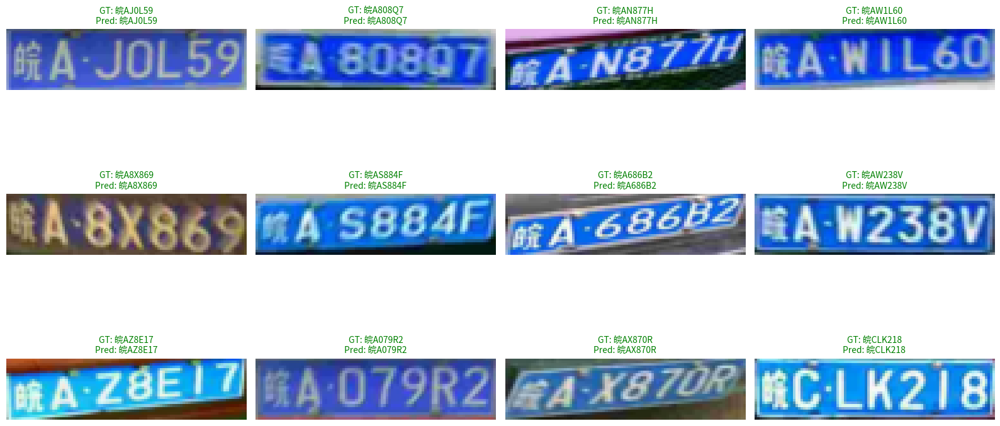

📄 CSV salvato in: /content/predictions.csv


In [ ]:
show_predictions_and_save_csv(model, val_set, device)

## Inference LPRNet


✅ Risultati su CCPD_BASE (test set):
🔠 Character Accuracy: 99.83%
📄 Sentence Accuracy: 99.18%
📄 Predizioni salvate in: /content/predictions_test_base.csv

🔍 Esempio #1 (idx=35971)
🔍 Input shape: torch.Size([1, 3, 24, 94])
🔍 Output shape: torch.Size([1, 22, 68])
🔍 Label string: '皖N7Y398'
🔍 Raw predictions (primi 15): tensor([ 0, 67, 67, 67, 67, 45, 67, 67, 67, 64, 67, 67, 55, 67, 67],
       device='cuda:0')
🔍 Raw predictions (caratteri): ['皖', '-', '-', '-', '-', 'N', '-', '-', '-', '7', '-', '-', 'Y', '-', '-']
🔍 pred_list type: <class 'str'>
🔍 pred_list value: '皖N7Y398'
🔍 Final pred_str: '皖N7Y398'

🔍 Esempio #2 (idx=7307)
🔍 Input shape: torch.Size([1, 3, 24, 94])
🔍 Output shape: torch.Size([1, 22, 68])
🔍 Label string: '皖AKG373'
🔍 Raw predictions (primi 15): tensor([ 0, 67, 67, 33, 33, 67, 67, 67, 42, 67, 67, 39, 67, 67, 60],
       device='cuda:0')
🔍 Raw predictions (caratteri): ['皖', '-', '-', 'A', 'A', '-', '-', '-', 'K', '-', '-', 'G', '-', '-', '3']
🔍 pred_list type: <class 'str

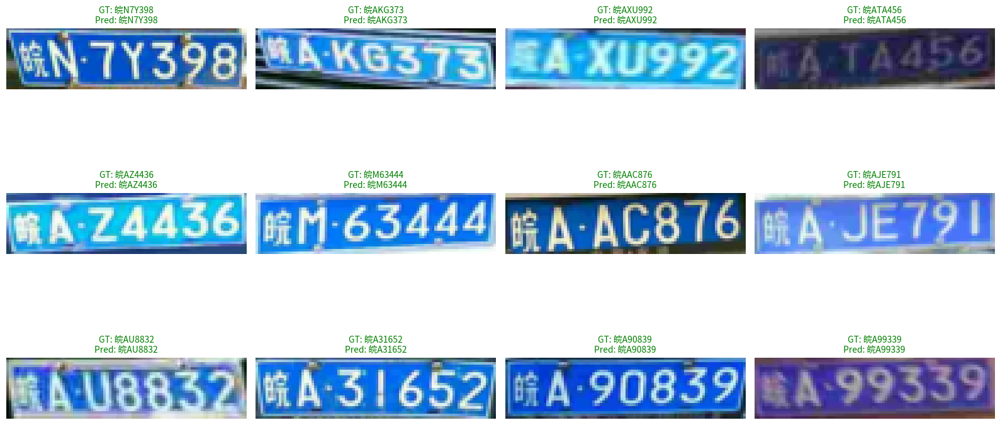

📄 CSV salvato in: /content/predictions_sample_base.csv


In [ ]:
# Load test images
with open("/content/drive/MyDrive/computerVisionProject/splits/test_imgs.json") as f:
    test_files = json.load(f)

test_set = LPRDataset("/content/content/cropped_plates_base", transform=transform, img_files=test_files)
test_loader = DataLoader(test_set, batch_size=32, shuffle=False, collate_fn=lambda x: x)

# evaluation
model.eval()
total_chars = 0
correct_chars = 0
total_sentences = 0
correct_sentences = 0

all_preds = []

with torch.no_grad():
    for batch in test_loader:
        imgs, labels, lengths = zip(*batch)
        imgs = torch.stack(imgs).to(device)

        outputs = model(imgs)
        decoded_batch = ctc_decode(outputs, blank_idx)

        label_strs = [''.join([idx2char[int(i)] for i in l]) for l in labels]

        for idx, (pred_str, gt_str) in enumerate(zip(decoded_batch, label_strs)):
            correct_chars += sum(p == g for p, g in zip(pred_str, gt_str))
            total_chars += len(gt_str)
            correct_sentences += (pred_str == gt_str)
            total_sentences += 1
            all_preds.append({
                "Index": idx,
                "Ground Truth": gt_str,
                "Prediction": pred_str,
                "Correct": pred_str == gt_str
            })

# Final Results
char_acc = correct_chars / total_chars * 100
sent_acc = correct_sentences / total_sentences * 100
print(f"\n✅ Risultati su CCPD_BASE (test set):")
print(f"🔠 Character Accuracy: {char_acc:.2f}%")
print(f"📄 Sentence Accuracy: {sent_acc:.2f}%")

# Save in a csv file
pd.DataFrame(all_preds).to_csv("/content/predictions_test_base.csv", index=False)
print("📄 Predizioni salvate in: /content/predictions_test_base.csv")

# Plot random predictions
show_predictions_and_save_csv(model, test_set, device, num_samples=12, csv_path="/content/predictions_sample_base.csv")


# Recognition - CRNN with CTC loss


## Model Architecture

In [ ]:
# 2. Architecture CRNN
# --------------------------------------------------
class CRNN(nn.Module):
    def __init__(self, num_classes, hidden_size=256, num_layers=2):
        super(CRNN, self).__init__()

        # CNN Feature Extraction
        self.cnn = nn.Sequential(
            # Input: [B, 1, 64, 160]
            nn.Conv2d(1, 64, 5, stride=1, padding=2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2, 2),  # [B, 64, 32, 80]

            nn.Conv2d(64, 128, 5, stride=1, padding=2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2, 2),  # [B, 128, 16, 40]

            nn.Conv2d(128, 256, 3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),

            nn.Conv2d(256, 256, 3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d((2, 2), (2, 1), (0, 1)),  # [B, 256, 8, 41]

            nn.Conv2d(256, 512, 3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),

            nn.Conv2d(512, 512, 3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.MaxPool2d((2, 2), (2, 1), (0, 1)),  # [B, 512, 4, 42]

            nn.Conv2d(512, 512, (4, 3), stride=1, padding=(0, 1)),  # [B, 512, 1, 42]
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True)
        )

        # RNN Sequence Modeling
        self.rnn = nn.Sequential(
            nn.LSTM(512, hidden_size, num_layers=num_layers,
                    bidirectional=True, batch_first=True)
        )

        # Classifier
        self.fc = nn.Linear(hidden_size * 2, num_classes)

    def forward(self, x):
        # CNN
        x = self.cnn(x)  # [B, 512, 1, 42]

        # Rimuovi dimensione altezza
        x = x.squeeze(2)  # [B, 512, 42]

        # Permute per sequenza temporale
        x = x.permute(0, 2, 1)  # [B, 42, 512]

        # RNN
        x, _ = self.rnn(x)  # [B, 42, hidden_size * 2]

        # Classifier
        x = self.fc(x)  # [B, 42, num_classes]
        return F.log_softmax(x, dim=2).permute(1, 0, 2)  # [42, B, num_classes] per CTCLoss

def ctc_decode(preds):
    """Decodifica predizioni CTC usando greedy decoding"""
    # preds: [T, B, C]
    preds = preds.permute(1, 0, 2)  # [B, T, C]
    indices = torch.argmax(preds, dim=2)  # [B, T]

    decoded = []
    for sample in indices:
        chars = []
        prev_char = -1
        for idx in sample:
            if idx != prev_char and idx != 0:  # Ignora blank (index 0) e ripetizioni
                chars.append(charset[idx])
            prev_char = idx
        decoded.append(''.join(chars))
    return decoded

## Dataset class and train loop

In [ ]:

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# 1. Dataset e Charset
provinces = list("皖沪津渝冀晋蒙辽吉黑苏浙京闽赣鲁豫鄂湘粤桂琼川贵云藏陕甘青宁新警学")
ads = list("ABCDEFGHJKLMNPQRSTUVWXYZ0123456789")

# Creazione charset unificato (con blank per CTC)
charset = ['-']  # blank character per CTC
charset += provinces
charset += ads
charset = sorted(set(charset))  # Rimuovi duplicati mantenendo ordine
char_to_idx = {c: i for i, c in enumerate(charset)}
num_classes = len(charset)

print(f"Charset size: {num_classes}")
print(f"Blank index: {charset.index('-')}")

class PlateCropDataset(Dataset):
    def __init__(self, csv_file, image_dir, transform=None):
        self.df = pd.read_csv(csv_file)
        self.image_dir = image_dir
        self.transform = transform or transforms.Compose([
            transforms.Resize((64, 160)),  # Altezza, Larghezza
            transforms.Grayscale(num_output_channels=1),  # CRNN funziona bene con canale singolo
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.5], std=[0.5])
        ])

        # Filter out samples with invalid plate lengths or characters
        valid_indices = []
        for idx in range(len(self.df)):
            plate_str = self.df.iloc[idx]['plate']
            # Check if plate is a string, has length > 0 and <= 7, and all chars are in charset
            if isinstance(plate_str, str) and 0 < len(plate_str) <= 7 and all(c in char_to_idx for c in plate_str):
                 # Check if image file exists and is valid
                img_path = os.path.join(self.image_dir, self.df.iloc[idx]['filename'])
                try:
                    Image.open(img_path).verify() # Verify image integrity
                    valid_indices.append(idx)
                except:
                    print(f"Skipping invalid image file: {self.df.iloc[idx]['filename']}")
                    pass

        self.df = self.df.iloc[valid_indices].reset_index(drop=True)
        print(f"Loaded {len(self.df)} valid samples.")


    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        image_path = os.path.join(self.image_dir, row['filename'])
        image = Image.open(image_path).convert('RGB')

        # Conversione label a indici
        plate_str = row['plate']
        label = [char_to_idx.get(c, 0) for c in plate_str] # Use .get(c, 0) to handle characters not in charset
        label_length = torch.tensor(len(label), dtype=torch.long)

        if self.transform:
            image = self.transform(image)

        return image, torch.tensor(label, dtype=torch.long), label_length

# Custom collate function
def custom_collate_fn(batch):
    # Filter out None values (if any, though __getitem__ should not return None)
    batch = [item for item in batch if item is not None]
    if not batch:
        return None, None, None # Return None for all elements if batch is empty

    images, labels, label_lengths = zip(*batch)

    # Stack images
    images = torch.stack(images)

    if not labels or all(len(l) == 0 for l in labels):
         return images, torch.tensor([], dtype=torch.long), torch.tensor([], dtype=torch.long)


    labels = torch.cat(labels)
    label_lengths = torch.stack(label_lengths)

    return images, labels, label_lengths


# 2. Training e Validation


def evaluate(model, dataloader, criterion):
    model.eval()
    total_loss = 0
    total_cer = 0  # Character Error Rate
    correct_seq = 0
    total_samples = 0

    with torch.no_grad():
        for images, labels, label_lengths in tqdm(dataloader):
            if images is None or labels.size(0) == 0: # Check if labels is empty
                continue

            images, labels, label_lengths = images.to(device), labels.to(device), label_lengths.to(device)

            log_probs = model(images)
            T, B, C = log_probs.shape
            input_lengths = torch.full((B,), T, dtype=torch.long, device=device)

            valid_indices = (label_lengths > 0) & (label_lengths <= T)
            if not valid_indices.all():
                 print(f"Warning: Skipping batch with invalid label lengths.")
                 continue

            # Calcola loss CTC
            loss = criterion(log_probs, labels, input_lengths, label_lengths)
            total_loss += loss.item() * images.size(0) # Use images.size(0) for actual batch size

            # Decodifica e valutazione
            decoded_preds = ctc_decode(log_probs)
            label_splits = torch.split(labels.cpu(), label_lengths.cpu().tolist())
            true_labels = [''.join(charset[idx] for idx in label) for label in label_splits]


            for pred, true in zip(decoded_preds, true_labels):
                total_cer += Levenshtein.distance(pred, true) / max(len(true), 1)
                if pred == true:
                    correct_seq += 1
                total_samples += 1

    avg_loss = total_loss / max(total_samples, 1) # Avoid division by zero
    seq_accuracy = correct_seq / max(total_samples, 1)
    cer = total_cer / max(total_samples, 1)
    return avg_loss, seq_accuracy, cer

# 3. Training Loop
def train_crnn():
    # Caricamento dataset
    full_dataset = PlateCropDataset('/content/yolo_crops_labels.csv', '/content/yolo_crops_v2')
    train_size = int(0.8 * len(full_dataset))
    val_size = len(full_dataset) - train_size
    train_ds, val_ds = random_split(full_dataset, [train_size, val_size])

    train_loader = DataLoader(train_ds, batch_size=64, shuffle=True, collate_fn=custom_collate_fn)
    val_loader = DataLoader(val_ds, batch_size=64, shuffle=False, collate_fn=custom_collate_fn)

    # Inizializzazione modello
    model = CRNN(num_classes).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=3, factor=0.5)
    criterion = nn.CTCLoss(blank=0)  # Blank index = 0

    # Parametri training
    best_cer = float('inf')
    patience = 5
    epochs_no_improve = 0

    for epoch in range(100):
        # Training
        model.train()
        train_loss = 0
        for images, labels, label_lengths in tqdm(train_loader):
            # Handle empty batches
            if images is None or labels.size(0) == 0: # Check if labels is empty
                continue

            # Move to device
            images, labels, label_lengths = images.to(device), labels.to(device), label_lengths.to(device)

            # Forward pass
            optimizer.zero_grad()
            log_probs = model(images)
            T, B, C = log_probs.shape
            input_lengths = torch.full((B,), T, dtype=torch.long, device=device)

            # Ensure label_lengths are within valid range for CTCLoss
            # Also ensure label_lengths do not exceed input_lengths
            valid_indices = (label_lengths > 0) & (label_lengths <= T)
            if not valid_indices.all():
                 print(f"Warning: Skipping batch with invalid label lengths.")
                 continue


            # loss CTC
            loss = criterion(log_probs, labels, input_lengths, label_lengths)

            # Backward pass
            loss.backward()
            optimizer.step()
            train_loss += loss.item() * images.size(0) # Use images.size(0) for actual batch size


        train_loss /= len(train_ds)

        # Validation
        val_loss, val_acc, val_cer = evaluate(model, val_loader, criterion)
        scheduler.step(val_loss)

        print(f"Epoch {epoch+1}/100:")
        print(f"  Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f}")
        print(f"  Val Seq Acc: {val_acc:.4f} | Val CER: {val_cer:.4f}")

        # Early stopping
        if val_cer < best_cer:
            best_cer = val_cer
            epochs_no_improve = 0
            torch.save(model.state_dict(), '/content/drive/MyDrive/computerVisionProject/best_crnn_model.pt')
            print("✅ Model improved. Saved checkpoint.")
        else:
            epochs_no_improve += 1
            print(f"⚠️ No improvement for {epochs_no_improve}/{patience} epochs")

            if epochs_no_improve >= patience:
                print("⛔ Early stopping triggered.")
                break

    print("Training complete!")
    return model

# 4. Main fn
if __name__ == "__main__":
    model = train_crnn()
    print("CRNN training completed!")

Using device: cuda
Charset size: 68
Blank index: 0
Loaded 19986 valid samples.


100%|██████████| 63/63 [00:12<00:00,  4.90it/s]


Epoch 1/100:
  Train Loss: 3.0429 | Val Loss: 2.5591
  Val Seq Acc: 0.0000 | Val CER: 0.7306
✅ Model improved. Saved checkpoint.


100%|██████████| 63/63 [00:13<00:00,  4.81it/s]


Epoch 2/100:
  Train Loss: 2.3335 | Val Loss: 1.6710
  Val Seq Acc: 0.0000 | Val CER: 0.5654
✅ Model improved. Saved checkpoint.


100%|██████████| 63/63 [00:14<00:00,  4.46it/s]


Epoch 3/100:
  Train Loss: 0.4238 | Val Loss: 0.1150
  Val Seq Acc: 0.8774 | Val CER: 0.0238
✅ Model improved. Saved checkpoint.


100%|██████████| 63/63 [00:14<00:00,  4.44it/s]


Epoch 4/100:
  Train Loss: 0.0716 | Val Loss: 0.0812
  Val Seq Acc: 0.8904 | Val CER: 0.0196
✅ Model improved. Saved checkpoint.


100%|██████████| 63/63 [00:14<00:00,  4.45it/s]


Epoch 5/100:
  Train Loss: 0.0416 | Val Loss: 0.0611
  Val Seq Acc: 0.9322 | Val CER: 0.0130
✅ Model improved. Saved checkpoint.


100%|██████████| 63/63 [00:14<00:00,  4.49it/s]


Epoch 6/100:
  Train Loss: 0.0358 | Val Loss: 0.0488
  Val Seq Acc: 0.9497 | Val CER: 0.0098
✅ Model improved. Saved checkpoint.


100%|██████████| 63/63 [00:14<00:00,  4.41it/s]


Epoch 7/100:
  Train Loss: 0.0292 | Val Loss: 0.0379
  Val Seq Acc: 0.9615 | Val CER: 0.0075
✅ Model improved. Saved checkpoint.


100%|██████████| 63/63 [00:14<00:00,  4.45it/s]


Epoch 8/100:
  Train Loss: 0.0236 | Val Loss: 0.0465
  Val Seq Acc: 0.9497 | Val CER: 0.0100
⚠️ No improvement for 1/5 epochs


100%|██████████| 63/63 [00:14<00:00,  4.41it/s]


Epoch 9/100:
  Train Loss: 0.0231 | Val Loss: 0.0416
  Val Seq Acc: 0.9575 | Val CER: 0.0085
⚠️ No improvement for 2/5 epochs


100%|██████████| 63/63 [00:14<00:00,  4.43it/s]


Epoch 10/100:
  Train Loss: 0.0206 | Val Loss: 0.0404
  Val Seq Acc: 0.9612 | Val CER: 0.0079
⚠️ No improvement for 3/5 epochs


100%|██████████| 63/63 [00:14<00:00,  4.46it/s]


Epoch 11/100:
  Train Loss: 0.0157 | Val Loss: 0.0364
  Val Seq Acc: 0.9642 | Val CER: 0.0077
⚠️ No improvement for 4/5 epochs


100%|██████████| 63/63 [00:14<00:00,  4.40it/s]


Epoch 12/100:
  Train Loss: 0.0137 | Val Loss: 0.0359
  Val Seq Acc: 0.9652 | Val CER: 0.0072
✅ Model improved. Saved checkpoint.


100%|██████████| 63/63 [00:14<00:00,  4.34it/s]


Epoch 13/100:
  Train Loss: 0.0152 | Val Loss: 0.0358
  Val Seq Acc: 0.9672 | Val CER: 0.0068
✅ Model improved. Saved checkpoint.


100%|██████████| 63/63 [00:14<00:00,  4.38it/s]


Epoch 14/100:
  Train Loss: 0.0110 | Val Loss: 0.0284
  Val Seq Acc: 0.9785 | Val CER: 0.0050
✅ Model improved. Saved checkpoint.


100%|██████████| 63/63 [00:14<00:00,  4.32it/s]


Epoch 15/100:
  Train Loss: 0.0089 | Val Loss: 0.0340
  Val Seq Acc: 0.9702 | Val CER: 0.0065
⚠️ No improvement for 1/5 epochs


100%|██████████| 63/63 [00:14<00:00,  4.34it/s]


Epoch 16/100:
  Train Loss: 0.0112 | Val Loss: 0.0332
  Val Seq Acc: 0.9730 | Val CER: 0.0060
⚠️ No improvement for 2/5 epochs


100%|██████████| 63/63 [00:14<00:00,  4.35it/s]


Epoch 17/100:
  Train Loss: 0.0119 | Val Loss: 0.0281
  Val Seq Acc: 0.9805 | Val CER: 0.0048
✅ Model improved. Saved checkpoint.


100%|██████████| 63/63 [00:14<00:00,  4.33it/s]


Epoch 18/100:
  Train Loss: 0.0082 | Val Loss: 0.0287
  Val Seq Acc: 0.9780 | Val CER: 0.0052
⚠️ No improvement for 1/5 epochs


100%|██████████| 63/63 [00:14<00:00,  4.35it/s]


Epoch 19/100:
  Train Loss: 0.0121 | Val Loss: 0.0435
  Val Seq Acc: 0.9597 | Val CER: 0.0085
⚠️ No improvement for 2/5 epochs


100%|██████████| 63/63 [00:14<00:00,  4.34it/s]


Epoch 20/100:
  Train Loss: 0.0094 | Val Loss: 0.0259
  Val Seq Acc: 0.9792 | Val CER: 0.0050
⚠️ No improvement for 3/5 epochs


100%|██████████| 63/63 [00:14<00:00,  4.32it/s]


Epoch 21/100:
  Train Loss: 0.0102 | Val Loss: 0.0285
  Val Seq Acc: 0.9802 | Val CER: 0.0050
⚠️ No improvement for 4/5 epochs


100%|██████████| 63/63 [00:14<00:00,  4.38it/s]

Epoch 22/100:
  Train Loss: 0.0066 | Val Loss: 0.0327
  Val Seq Acc: 0.9740 | Val CER: 0.0058
⚠️ No improvement for 5/5 epochs
⛔ Early stopping triggered.
Training complete!
CRNN training completed!


## Visualize results

Loaded 19986 valid samples.


/tmp/ipython-input-12-3123213153.py:47: UserWarning: Glyph 30358 (\N{CJK UNIFIED IDEOGRAPH-7696}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-12-3123213153.py:47: UserWarning: Glyph 33487 (\N{CJK UNIFIED IDEOGRAPH-82CF}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-12-3123213153.py:47: UserWarning: Glyph 20140 (\N{CJK UNIFIED IDEOGRAPH-4EAC}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 30358 (\N{CJK UNIFIED IDEOGRAPH-7696}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 33487 (\N{CJK UNIFIED IDEOGRAPH-82CF}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 20140 (\N{CJK UNIFIED IDEOGRAPH-4EAC})

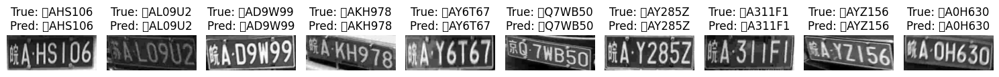

Risultati salvati in validation_results.csv

Riepilogo prestazioni:
Accuracy complessiva: 100.00%

Esempi di predizioni:
  true_label predicted_label  correct
0    皖AHS106         皖AHS106     True
1    苏AL09U2         苏AL09U2     True
2    皖AD9W99         皖AD9W99     True
3    皖AKH978         皖AKH978     True
4    皖AY6T67         皖AY6T67     True
5    京Q7WB50         京Q7WB50     True
6    皖AY285Z         皖AY285Z     True
7    皖A311F1         皖A311F1     True
8    皖AYZ156         皖AYZ156     True
9    皖A0H630         皖A0H630     True

Classification report:
              precision    recall  f1-score   support

     京Q7WB50       1.00      1.00      1.00         1
     皖A0H630       1.00      1.00      1.00         1
     皖A311F1       1.00      1.00      1.00         1
     皖A7X211       1.00      1.00      1.00         1
     皖AD9W99       1.00      1.00      1.00         1
     皖AG686S       1.00      1.00      1.00         1
     皖AHH240       1.00      1.00      1.00         1
    

In [ ]:
def visualize_results(model, val_loader, num_samples=5, save_csv=True):
    model.eval()
    results = []

    for images, labels, label_lengths in val_loader:
        if images is None:
            continue

        images = images.to(device)
        labels = labels.to(device)
        label_lengths = label_lengths.to(device)

        with torch.no_grad():
            log_probs = model(images)


        decoded_preds = ctc_decode(log_probs)

        true_labels = []
        for i in range(labels.size(0)):
            length = label_lengths[i].item()
            true_label = ''.join(charset[idx.item()] for idx in labels[i][:length])
            true_labels.append(true_label)

        for i in range(len(true_labels)):
            results.append({
                'true_label': true_labels[i],
                'predicted_label': decoded_preds[i],
                'correct': true_labels[i] == decoded_preds[i]
            })

        if num_samples > 0:
            fig, axes = plt.subplots(1, min(num_samples, len(true_labels)), figsize=(15, 3))
            for i, ax in enumerate(axes):
                img = images[i].cpu().squeeze().numpy()
                ax.imshow(img, cmap='gray')
                ax.set_title(f"True: {true_labels[i]}\nPred: {decoded_preds[i]}")
                ax.axis('off')
            plt.tight_layout()
            plt.show()
            num_samples -= len(true_labels)

        if num_samples <= 0:
            break

    results_df = pd.DataFrame(results)

    if save_csv:
        results_df.to_csv('validation_results.csv', index=False)
        print("Risultati salvati in validation_results.csv")

    print("\nRiepilogo prestazioni:")
    print(f"Accuracy complessiva: {results_df['correct'].mean():.2%}")
    print("\nEsempi di predizioni:")
    print(results_df.head(10))

    print("\nClassification report:")
    print(classification_report(
        results_df['true_label'],
        results_df['predicted_label'],
        zero_division=0
    ))

    return results_df

model = CRNN(num_classes).to(device)
model.load_state_dict(torch.load('best_crnn_model.pt'))
model.eval()


full_dataset = PlateCropDataset('/content/yolo_crops_labels.csv', '/content/yolo_crops')
_, val_ds = random_split(full_dataset, [0.8, 0.2])
val_loader = DataLoader(val_ds, batch_size=16, shuffle=False, collate_fn=collate_fn)

results = visualize_results(model, val_loader, num_samples=10, save_csv=True)

## Inference CRNN

Numero di immagini totali: 200581
Numero di immagini usate per training: 100000
Numero di nuove immagini da processare: 100293
Numero di nuove immagini da processare (limitato a 5000): 5000
Overlap tra test e train (filename): 0
Cropping immagini...


100%|██████████| 5000/5000 [00:22<00:00, 222.58it/s]


Immagini croppate con successo: 4978/5000
Eseguendo inference...


Inference: 100%|██████████| 78/78 [00:16<00:00,  4.66it/s]


Risultati salvati in test_results_with_gt_crnn_base.csv

📊 Sequence Accuracy (targhe corrette al 100%): 98.27%

🔢 Percentuale targhe con lunghezza corretta: 99.78%

🔡 Character-level accuracy: 99.70%

10 esempi casuali:
                                               filename predicted_plate  \
1682  0338900862069-88_89-143&643_489&750-481&743_15...         皖HCC362   
4923  0370114942529-91_86-176&480_532&606-534&599_18...         皖AAZ299   
4658  0148778735633-90_83-236&507_476&577-462&586_24...         皖AGQ736   
4310  0396036877395-89_91-172&480_524&600-527&580_18...         皖A8T027   
1592  0245150862069-90_85-253&451_550&550-556&561_25...         皖AW922M   
2154  0299209770115-86_95-241&551_508&654-513&631_25...         皖AX282T   
1324  0270210727969-79_103-229&412_449&513-448&481_2...         皖ALW926   
2356  0105340038314-90_87-265&463_456&525-474&531_26...         皖AJ636L   
1897  0239224137931-90_84-193&482_479&583-474&572_18...         皖AK388C   
865   00862068965517-91_84-346

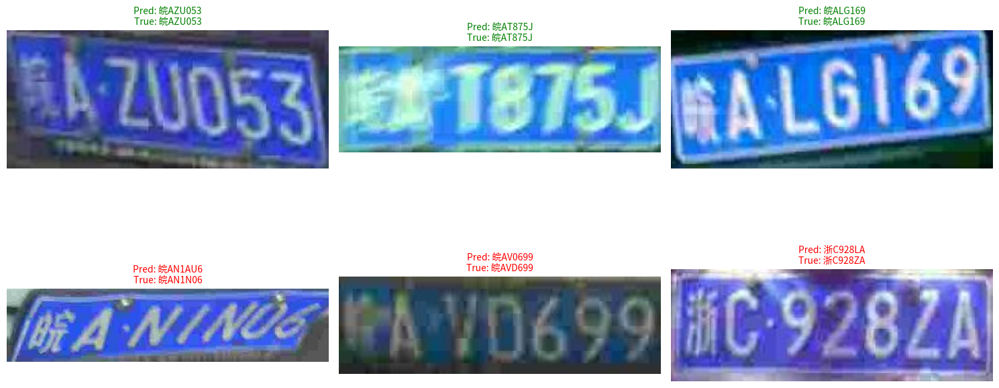


Salvati 86 errori in test_errors_crnn.csv


In [ ]:
# Configurazione
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model_path = '/content/drive/MyDrive/computerVisionProject/best_crnn_model.pt'
dataset_type = 'base'
yolo_preds_path = f'yolo_preds_{dataset_type}.csv'
df = pd.read_csv(yolo_preds_path)
test_images_dir = f'/content/content/dataset/CCPD2019/ccpd_{dataset_type}'  # Cartella con le immagini originali
output_dir = f'test_crops_{dataset_type}'  # Cartella per salvare i crops
if os.path.exists(output_dir):
    shutil.rmtree(output_dir)
os.makedirs(output_dir, exist_ok=True)

# 1. Dataset e Charset
# --------------------------------------------------
provinces = list("皖沪津渝冀晋蒙辽吉黑苏浙京闽赣鲁豫鄂湘粤桂琼川贵云藏陕甘青宁新警学")
ads = list("ABCDEFGHJKLMNPQRSTUVWXYZ0123456789")

charset = ['-']
charset += provinces
charset += ads
charset = sorted(set(charset))  # remove duplicates keeping order
char_to_idx = {c: i for i, c in enumerate(charset)}
num_classes = len(charset)


def extract_license_plate(filename):
    provinces = ["皖", "沪", "津", "渝", "冀", "晋", "蒙", "辽", "吉", "黑", "苏", "浙", "京", "闽", "赣", "鲁", "豫", "鄂", "湘", "粤", "桂",
                "琼", "川", "贵", "云", "藏", "陕", "甘", "青", "宁", "新", "警", "学", "O"]
    alphabets = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'J', 'K', 'L', 'M', 'N', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W',
                'X', 'Y', 'Z', 'O']
    ads = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'J', 'K', 'L', 'M', 'N', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X',
          'Y', 'Z', '0', '1', '2', '3', '4', '5', '6', '7', '8', '9', 'O']

    parts = filename.split('-')
    if len(parts) < 5:
        return None

    lp_encoded = parts[4]
    char_codes = lp_encoded.split('_')

    if len(char_codes) != 7:
        return None

    try:
        province = provinces[int(char_codes[0])]
        letter = alphabets[int(char_codes[1])]
        char1 = ads[int(char_codes[2])]
        char2 = ads[int(char_codes[3])]
        char3 = ads[int(char_codes[4])]
        char4 = ads[int(char_codes[5])]
        char5 = ads[int(char_codes[6])]

        license_plate = province + letter + char1 + char2 + char3 + char4 + char5
        license_plate = license_plate.replace('O', '')

        return license_plate
    except (ValueError, IndexError):
        return None

# 2. load CRNN model
model = CRNN(num_classes).to(device)
model.load_state_dict(torch.load(model_path))
model.eval()


all_preds = pd.read_csv(yolo_preds_path)

# verify no overlap between train and test imaegs
train_filenames_raw = pd.read_csv('/content/yolo_crops_labels_subset_100k.csv')['filename']
train_filenames = set(name.split('_', 2)[-1] for name in train_filenames_raw)

print(f"Numero di immagini totali: {len(all_preds)}")
print(f"Numero di immagini usate per training: {len(train_filenames)}")

test_preds = all_preds[~all_preds['filename'].isin(train_filenames)].reset_index(drop=True)
print(f"Numero di nuove immagini da processare: {len(test_preds)}")

# (Facoltativo) Limita a 5000 immagini
test_preds = test_preds.head(5000)
print(f"Numero di nuove immagini da processare (limitato a 5000): {len(test_preds)}")

filename_overlap = set(test_preds['filename']) & train_filenames
print(f"Overlap tra test e train (filename): {len(filename_overlap)}")  # Deve essere 0


# 3. Crop and save fn
def crop_and_save(row):
    if row['iou'] >= 0.6:
        img_path = os.path.join(test_images_dir, row['filename'])
        try:
            img = Image.open(img_path).convert('RGB')
            crop = img.crop((row['x1'], row['y1'], row['x2'], row['y2']))
            crop.save(os.path.join(output_dir, row['filename']))
            return True
        except Exception as e:
            print(f"Errore processando {row['filename']}: {str(e)}")
            return False


# 4. Process new imagess
print("Cropping immagini...")
success_count = 0
for _, row in tqdm(test_preds.iterrows(), total=len(test_preds)):
    if crop_and_save(row):
        success_count += 1
print(f"Immagini croppate con successo: {success_count}/{len(test_preds)}")

# 5. Test dataset class
class TestDataset(Dataset):
    def __init__(self, crop_dir, transform=None):
        self.crop_dir = crop_dir
        self.filenames = [f for f in os.listdir(crop_dir) if f.endswith(('.jpg', '.png', '.jpeg'))]
        self.transform = transform or transforms.Compose([
            transforms.Resize((64, 160)),
            transforms.Grayscale(num_output_channels=1),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.5], std=[0.5])
        ])

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, idx):
        img_path = os.path.join(self.crop_dir, self.filenames[idx])
        image = Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image, self.filenames[idx]

test_dataset = TestDataset(output_dir)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)

# 6. Inference
def run_inference_with_gt(model, dataloader):
    results = []
    model.eval()

    with torch.no_grad():
        for images, filenames in tqdm(dataloader, desc='Inference'):
            images = images.to(device)
            log_probs = model(images)
            decoded_preds = ctc_decode(log_probs)

            for filename, pred in zip(filenames, decoded_preds):
                gt_plate = extract_license_plate(filename)
                if gt_plate is not None:  # Salva solo se il GT è valido
                    results.append({
                        'filename': filename,
                        'predicted_plate': pred,
                        'true_plate': gt_plate,
                        'correct': pred == gt_plate
                    })

    return pd.DataFrame(results)

print("Eseguendo inference...")
results_df = run_inference_with_gt(model, test_loader)
results_df.to_csv(f'test_results_with_gt_crnn_{dataset_type}.csv', index=False)
print(f"Risultati salvati in test_results_with_gt_crnn_{dataset_type}.csv")

# 7. Validation metrics
if len(results_df) > 0:
    accuracy = results_df['correct'].mean()
    print(f"\n📊 Sequence Accuracy (targhe corrette al 100%): {accuracy:.2%}")

    length_matches = (results_df['predicted_plate'].str.len() == results_df['true_plate'].str.len()).mean()
    print(f"\n🔢 Percentuale targhe con lunghezza corretta: {length_matches:.2%}")

    char_comparisons = []
    for _, row in results_df.iterrows():
        pred, true = row['predicted_plate'], row['true_plate']
        min_len = min(len(pred), len(true))
        for i in range(min_len):
            char_comparisons.append((true[i], pred[i]))

    char_df = pd.DataFrame(char_comparisons, columns=['true', 'pred'])
    char_acc = (char_df['true'] == char_df['pred']).mean()
    print(f"\n🔡 Character-level accuracy: {char_acc:.2%}")

    print("\n10 esempi casuali:")
    print(results_df.sample(10))

    sample_results = pd.concat([
        results_df[results_df['correct']].sample(3),
        results_df[~results_df['correct']].sample(3)
    ])
    font_path = "/usr/share/fonts/opentype/noto/NotoSansCJK-Regular.ttc"
    font_prop = fm.FontProperties(fname=font_path)

    plt.figure(figsize=(15, 8))
    for i, (_, row) in enumerate(sample_results.iterrows(), 1):
        img = Image.open(os.path.join(output_dir, row['filename']))
        plt.subplot(2, 3, i)
        plt.imshow(img)
        color = 'green' if row['correct'] else 'red'
        plt.title(f"Pred: {row['predicted_plate']}\nTrue: {row['true_plate']}", color=color, fontproperties=font_prop)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

    errors_df = results_df[~results_df['correct']]
    errors_df.to_csv(f'test_errors_crnn_{dataset_type}.csv', index=False)
    print(f"\nSalvati {len(errors_df)} errori in test_errors_crnn.csv")
else:
    print("\nNessun risultato valido ottenuto. Verifica l'estrazione del ground truth dai nomi file.")

In [ ]:
df_prova = pd.read_csv('/content/test_results_with_gt.csv')
len_errors = df_prova[df_prova['correct'] == False].shape[0]
print(f"Numero di errori: {len_errors}")
len_total = df_prova.shape[0]
print(f"Numero totale di immagini: {len_total}")
accuracy = (len_total - len_errors) / len_total
print(f"Accuracy: {accuracy}")

Numero di errori: 378
Numero totale di immagini: 39977
Accuracy: 0.9905445631237961


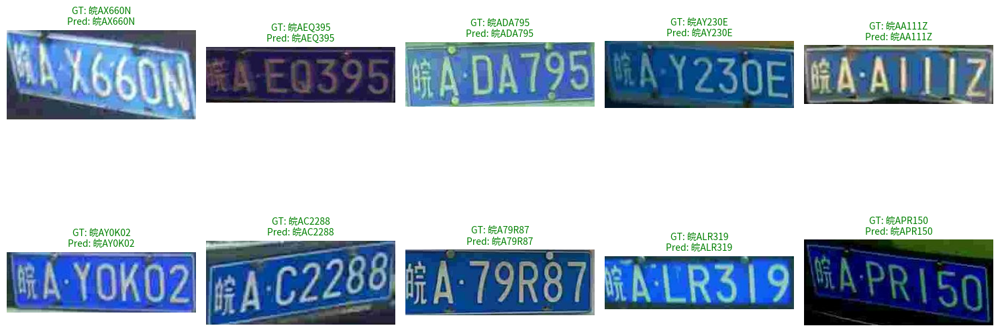

In [ ]:
def visualize_crops_only(results_csv='test_results_with_gt.csv',
                         crops_dir='test_crops',
                         num_samples=10,
                         show_errors=True):

    df = pd.read_csv(results_csv)

    if show_errors:
        correct = df[df['correct'] == False]
        correct = correct.sample(min(num_samples, len(correct)))
    else:
        correct = df[df['correct'] == True]
        correct = correct.sample(min(num_samples, len(correct)))

    font_path = "/usr/share/fonts/opentype/noto/NotoSansCJK-Regular.ttc"
    font_prop = fm.FontProperties(fname=font_path)

    plt.figure(figsize=(15, 8))

    for i, (_, row) in enumerate(correct.iterrows(), 1):
        try:
            img_path = os.path.join(crops_dir, row['filename'])
            img = Image.open(img_path)

            ax = plt.subplot(2, 5, i)
            ax.imshow(img, cmap='gray')
            color = 'green' if row['correct'] else 'red'
            ax.set_title(f"GT: {row['true_plate']}\nPred: {row['predicted_plate']}",
                         fontsize=10, color=color, fontproperties=font_prop)
            ax.axis('off')
        except Exception as e:
            print(f"Errore caricando {row['filename']}: {e}")
            continue

    plt.tight_layout()
    plt.show()

# Esempio: mostra 10 predizioni sbagliate
#visualize_crops_only(num_samples=10, show_errors=True)

# Esempio: mostra 10 predizioni corrette
visualize_crops_only(num_samples=10, show_errors=False)


verify that dataset contains differents photos of the same car

In [ ]:
train_plates = set(extract_license_plate(f) for f in train_filenames)
test_plates = set(extract_license_plate(f) for f in test_preds['filename'])

overlap = train_plates & test_plates
print(f"Targhe comuni tra train e test: {len(overlap)}")

Targhe comuni tra train e test: 19082


✅ Targa più frequente: 皖AP7215 (6 occorrenze)


/tmp/ipython-input-70-2719609895.py:57: UserWarning: Glyph 30358 (\N{CJK UNIFIED IDEOGRAPH-7696}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 30358 (\N{CJK UNIFIED IDEOGRAPH-7696}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


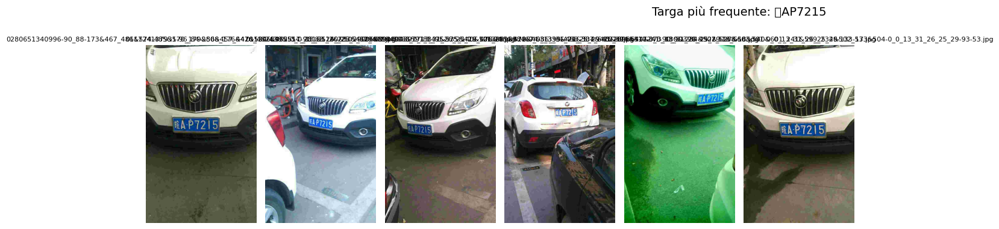

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
from collections import Counter

# Config
csv_path = 'yolo_predictions_200k_1.csv'
img_dir = '/content/content/dataset/CCPD2019/ccpd_base'  # directory immagini originali
max_images = 20  # massimo numero di immagini da mostrare per la targa più frequente

# Funzione di parsing targa
def extract_license_plate(filename):
    provinces = ["皖", "沪", "津", "渝", "冀", "晋", "蒙", "辽", "吉", "黑", "苏", "浙", "京", "闽", "赣", "鲁", "豫", "鄂", "湘", "粤", "桂",
                 "琼", "川", "贵", "云", "藏", "陕", "甘", "青", "宁", "新", "警", "学", "O"]
    alphabets = list("ABCDEFGHJKLMNPQRSTUVWXYZ")
    ads = list("ABCDEFGHJKLMNPQRSTUVWXYZ0123456789")

    parts = filename.split('-')
    if len(parts) < 5:
        return None
    try:
        codes = parts[4].split('_')
        if len(codes) != 7:
            return None
        plate = provinces[int(codes[0])] + alphabets[int(codes[1])] + ''.join(ads[int(c)] for c in codes[2:])
        return plate.replace('O', '')
    except:
        return None

# Carica CSV
df = pd.read_csv(csv_path)
df['plate'] = df['filename'].apply(extract_license_plate)
df = df.dropna(subset=['plate'])

# Conta le occorrenze delle targhe
plate_counts = Counter(df['plate'])
most_common_plate, count = plate_counts.most_common(1)[0]
print(f"✅ Targa più frequente: {most_common_plate} ({count} occorrenze)")

# Filtra i file che contengono quella targa
df_filtered = df[df['plate'] == most_common_plate].head(max_images)

# Plot delle immagini associate
plt.figure(figsize=(20, 8))
for i, row in enumerate(df_filtered.itertuples(), 1):
    try:
        img_path = os.path.join(img_dir, row.filename)
        img = Image.open(img_path)
        ax = plt.subplot(2, (max_images + 1)//2, i)
        ax.imshow(img)
        ax.set_title(f"{row.filename}", fontsize=8)
        ax.axis('off')
    except Exception as e:
        print(f"Errore aprendo {row.filename}: {e}")
plt.suptitle(f"Targa più frequente: {most_common_plate}", fontsize=14)
plt.tight_layout()
plt.show()


# Recognition Final Model - PDLPR model

## Utils function
Take only 100k samples from base dataset

In [ ]:

df_cropped = pd.read_csv('yolo_crops_labels_base.csv')
df_subset = df_cropped.sample(n=100000, random_state=42)

df_subset.to_csv('yolo_crops_labels_subset_100k.csv', index=False)

print(f"Creato subset di 100,000 righe in 'yolo_crops_labels_subset_100k.csv'")


Creato subset di 100,000 righe in 'yolo_crops_labels_subset_100k.csv'


## Train and evaluation
Implemented dataset class, model architecture and train and evaluation loops

In [ ]:

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# 1. Dataset e Charset
provinces = list("皖沪津渝冀晋蒙辽吉黑苏浙京闽赣鲁豫鄂湘粤桂琼川贵云藏陕甘青宁新警学")
ads = list("ABCDEFGHJKLMNPQRSTUVWXYZ0123456789")
charset = ['-'] + provinces + ads
char_to_idx = {c: i for i, c in enumerate(charset)}
num_classes = len(charset)

print(f"Charset size: {num_classes}")
print(f"Blank index: {0}")

transform_train = transforms.Compose([
    transforms.Resize((48, 144)),
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.1),
    transforms.RandomRotation(degrees=2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    transforms.RandomErasing(p=0.1, scale=(0.02, 0.1))
])

transform_val = transforms.Compose([
    transforms.Resize((48, 144)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

class PlateCropDataset(Dataset):
    def __init__(self, csv_file, image_dir, transform=None):
        self.df = pd.read_csv(csv_file)
        self.image_dir = image_dir
        self.transform = transform

        valid_indices = []
        for idx in range(len(self.df)):
            plate_str = str(self.df.iloc[idx]['plate'])
            img_path = os.path.join(self.image_dir, self.df.iloc[idx]['filename'])

            if (0 < len(plate_str) <= 7 and
                all(c in char_to_idx for c in plate_str) and
                os.path.exists(img_path)):
                try:
                    Image.open(img_path).verify()
                    valid_indices.append(idx)
                except:
                    print(f"Skipping invalid image: {img_path}")

        self.df = self.df.iloc[valid_indices].reset_index(drop=True)
        print(f"Loaded {len(self.df)} valid samples")

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_path = os.path.join(self.image_dir, row['filename'])
        image = Image.open(img_path).convert('RGB')

        plate_str = str(row['plate'])
        label = [char_to_idx[c] for c in plate_str]
        label_length = torch.tensor(len(label), dtype=torch.long)

        if self.transform:
            image = self.transform(image)

        return image, torch.tensor(label, dtype=torch.long), label_length

def custom_collate_fn(batch):
    images, labels, label_lengths = zip(*batch)
    images = torch.stack(images)

    labels = pad_sequence(labels, batch_first=True, padding_value=0)
    label_lengths = torch.stack(label_lengths)

    return images, labels, label_lengths

# 2. Architecture PDLPR - Parallel Decoder

class SEBlock(nn.Module):
    """Squeeze-and-Excitation Block per migliorare l'attenzione sui channel"""
    def __init__(self, channels, reduction=16):
        super().__init__()
        self.fc = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Conv2d(channels, channels // reduction, 1),
            nn.ReLU(inplace=True),
            nn.Conv2d(channels // reduction, channels, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return x * self.fc(x)

class ImprovedIGFE(nn.Module):
    """Improved Global Feature Extractor con ResNet-like blocks e SE attention"""
    def __init__(self):
        super().__init__()

        # Stage 1: Initial conv
        self.stage1 = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2)  # 48x144 -> 24x72
        )

        # Stage 2: ResNet-like blocks
        self.stage2 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            SEBlock(128),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2)  # 24x72 -> 12x36
        )

        # Stage 3: Deeper features
        self.stage3 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            SEBlock(256),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=(2, 1), stride=(2, 1))  # 12x36 -> 6x36
        )

        # Stage 4: Final features
        self.stage4 = nn.Sequential(
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            SEBlock(512),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=(2, 1), stride=(2, 1))  # 6x36 -> 3x36
        )

        # Adaptive pooling per standardizzare le dimensioni
        self.adaptive_pool = nn.AdaptiveAvgPool2d((1, 36))

    def forward(self, x):
        x = self.stage1(x)
        x = self.stage2(x)
        x = self.stage3(x)
        x = self.stage4(x)
        x = self.adaptive_pool(x)  # (B, 512, 1, 36)
        return x.squeeze(2)  # (B, 512, 36)

class MultiHeadCrossAttention(nn.Module):
    """Multi-head cross attention per il parallel decoder"""
    def __init__(self, d_model, nhead):
        super().__init__()
        self.multihead_attn = nn.MultiheadAttention(d_model, nhead, batch_first=True)
        self.norm = nn.LayerNorm(d_model)
        self.dropout = nn.Dropout(0.1)

    def forward(self, query, key, value, key_padding_mask=None):
        attn_output, _ = self.multihead_attn(
            query, key, value, key_padding_mask=key_padding_mask
        )
        return self.norm(query + self.dropout(attn_output))

class ParallelCharacterDecoder(nn.Module):
    """Parallel decoder per ogni posizione del carattere"""
    def __init__(self, d_model, nhead, num_classes):
        super().__init__()
        self.d_model = d_model
        self.self_attn = nn.MultiheadAttention(d_model, nhead, batch_first=True)
        self.cross_attn = MultiHeadCrossAttention(d_model, nhead)
        self.feed_forward = nn.Sequential(
            nn.Linear(d_model, d_model * 4),
            nn.ReLU(),
            nn.Dropout(0.1),
            nn.Linear(d_model * 4, d_model)
        )
        self.norm1 = nn.LayerNorm(d_model)
        self.norm2 = nn.LayerNorm(d_model)
        self.norm3 = nn.LayerNorm(d_model)
        self.classifier = nn.Linear(d_model, num_classes)
        self.dropout = nn.Dropout(0.1)

    def forward(self, tgt, memory):
        # Verifica dimensioni
        assert tgt.size(-1) == self.d_model, f"tgt dim: {tgt.size(-1)}, expected: {self.d_model}"
        assert memory.size(-1) == self.d_model, f"memory dim: {memory.size(-1)}, expected: {self.d_model}"

        # Self attention tra le posizioni dei caratteri
        tgt2, _ = self.self_attn(tgt, tgt, tgt)
        tgt = self.norm1(tgt + self.dropout(tgt2))

        # Cross attention con le feature dell'immagine
        tgt2 = self.cross_attn(tgt, memory, memory)
        tgt = self.norm2(tgt + tgt2)

        # Feed forward
        tgt2 = self.feed_forward(tgt)
        tgt = self.norm3(tgt + self.dropout(tgt2))

        return tgt

class PDLPR(nn.Module):
    """PDLPR con architettura parallel decoder migliorata"""
    def __init__(self, num_classes, d_model=512, nhead=8, num_decoder_layers=6):
        super().__init__()

        self.d_model = d_model
        self.num_classes = num_classes

        # Feature extractor migliorato
        self.igfe = ImprovedIGFE()

        # Positional encoding per le feature
        self.feature_pos_embed = nn.Parameter(torch.randn(1, 36, d_model) * 0.02)

        # Character position embeddings (7 posizioni per targa)
        self.char_pos_embed = nn.Parameter(torch.randn(7, d_model) * 0.02)

        # Parallel decoders (uno per ogni layer)
        self.decoder_layers = nn.ModuleList([
            ParallelCharacterDecoder(d_model, nhead, num_classes)
            for _ in range(num_decoder_layers)
        ])

        # Feature projection
        self.feature_proj = nn.Linear(512, d_model)

        # Learnable character queries
        self.char_queries = nn.Parameter(torch.randn(1, 7, d_model) * 0.02)

        # Layer normalization
        self.layer_norm = nn.LayerNorm(d_model)

        # Final classifier - spostato qui per evitare confusione
        self.final_classifier = nn.Linear(d_model, num_classes)

    def forward(self, x):
        batch_size = x.size(0)

        # Feature extraction
        features = self.igfe(x)  # (B, 512, 36)
        features = features.permute(0, 2, 1)  # (B, 36, 512)
        features = self.feature_proj(features)  # (B, 36, d_model)

        # Verifica dimensioni dopo projection
        assert features.size(-1) == self.d_model, f"Features dim after proj: {features.size(-1)}, expected: {self.d_model}"

        # Add positional encoding to features
        features = features + self.feature_pos_embed
        features = self.layer_norm(features)

        # Initialize character queries
        tgt = self.char_queries.repeat(batch_size, 1, 1)  # (B, 7, d_model)
        tgt = tgt + self.char_pos_embed.unsqueeze(0)

        # Verifica dimensioni delle queries
        assert tgt.size(-1) == self.d_model, f"Target queries dim: {tgt.size(-1)}, expected: {self.d_model}"

        # Apply decoder layers
        for i, decoder_layer in enumerate(self.decoder_layers):
            tgt = decoder_layer(tgt, features)  # Restituisce sempre (B, 7, d_model)
            assert tgt.size(-1) == self.d_model, f"Layer {i} output dim: {tgt.size(-1)}, expected: {self.d_model}"

        # Final classification
        output = self.final_classifier(tgt)  # (B, 7, num_classes)
        assert output.size(-1) == self.num_classes, f"Final output dim: {output.size(-1)}, expected: {self.num_classes}"

        return output  # (B, 7, num_classes)

# 3. trainning functions

class LabelSmoothingCrossEntropy(nn.Module):
    """Label smoothing per ridurre overfitting"""
    def __init__(self, eps=0.1):
        super().__init__()
        self.eps = eps

    def forward(self, output, target):
        c = output.size(-1)
        log_preds = F.log_softmax(output, dim=-1)
        loss = -log_preds.sum(dim=-1).mean()
        nll = F.nll_loss(log_preds, target, reduction='mean')
        return (1 - self.eps) * nll + self.eps * (loss / c)

def decode_predictions_improved(preds, charset):
    """Decodifica migliorata delle predizioni"""
    # preds shape: (batch, 7, num_classes)
    _, indices = torch.max(preds, 2)  # (batch, 7)
    indices = indices.cpu().numpy()

    texts = []
    for pred in indices:
        decoded = ''.join([charset[char_idx] if char_idx != 0 else '' for char_idx in pred])
        texts.append(decoded)
    return texts

def calculate_edit_distance(s1, s2):
    """Simple edit distance implementation to avoid dependency on editdistance package"""
    if len(s1) < len(s2):
        return calculate_edit_distance(s2, s1)

    if len(s2) == 0:
        return len(s1)

    previous_row = list(range(len(s2) + 1))
    for i, c1 in enumerate(s1):
        current_row = [i + 1]
        for j, c2 in enumerate(s2):
            insertions = previous_row[j + 1] + 1
            deletions = current_row[j] + 1
            substitutions = previous_row[j] + (c1 != c2)
            current_row.append(min(insertions, deletions, substitutions))
        previous_row = current_row

    return previous_row[-1]

def calculate_metrics_improved(preds, targets, target_lengths, charset):
    pred_texts = decode_predictions_improved(preds, charset)

    cer = 0
    correct = 0
    total = 0
    char_correct = 0
    char_total = 0

    for i, (pred, target) in enumerate(zip(pred_texts, targets)):
        target = target[:target_lengths[i]].cpu().numpy()
        gt_text = ''.join([charset[c] for c in target if c != 0])

        max_len = 7
        pred_clean = pred.strip()

        for pos in range(max_len):
            if pos < len(gt_text):  # Ground truth has character at this position
                char_total += 1
                if pos < len(pred_clean) and pred_clean[pos] == gt_text[pos]:
                    char_correct += 1

        # Sequence accuracy
        if pred_clean == gt_text:
            correct += 1
        total += 1

        # CER using our simple edit distance implementation
        if len(gt_text) > 0:
            dist = calculate_edit_distance(pred_clean, gt_text)
            cer += dist / len(gt_text)

    seq_acc = correct / max(total, 1)
    char_acc = char_correct / max(char_total, 1)
    avg_cer = cer / max(total, 1)

    return seq_acc, char_acc, avg_cer

def train_improved_pdlpr():
    full_dataset = PlateCropDataset('yolo_crops_labels_subset_100k.csv', 'yolo_crops_base', transform=None)

    train_size = int(0.8 * len(full_dataset))
    val_size = len(full_dataset) - train_size

    indices = list(range(len(full_dataset)))
    np.random.shuffle(indices)
    train_indices, val_indices = indices[:train_size], indices[train_size:]

    train_dataset = torch.utils.data.Subset(
        PlateCropDataset('yolo_crops_labels_subset_100k.csv', 'yolo_crops_base', transform=transform_train),
        train_indices
    )

    val_dataset = torch.utils.data.Subset(
        PlateCropDataset('yolo_crops_labels_subset_100k.csv', 'yolo_crops_base', transform=transform_val),
        val_indices
    )
    print(f"Numero di immagini nel training set: {len(train_dataset)}")
    print(f"Numero di immagini nel validation set: {len(val_dataset)}")


    train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True,
                            collate_fn=custom_collate_fn, num_workers=2,
                            pin_memory=True)
    val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False,
                          collate_fn=custom_collate_fn, num_workers=2,
                          pin_memory=True)

    model = PDLPR(num_classes, d_model=512, nhead=8, num_decoder_layers=3).to(device)

    # Optimizer con warmup
    optimizer = optim.AdamW(model.parameters(), lr=0.0001, weight_decay=0.01)

    # Scheduler con warmup
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=5)

    # Loss con label smoothing
    criterion = LabelSmoothingCrossEntropy(eps=0.1)

    # Training parameters
    best_char_acc = 0.0
    patience = 10
    epochs_no_improve = 0

    print("Starting training with improved PDLPR architecture...")

    for epoch in range(50):
        # Training
        model.train()
        train_loss = 0
        train_samples = 0

        pbar = tqdm(train_loader, desc=f'Epoch {epoch+1}/50')
        for batch_idx, (images, labels, label_lengths) in enumerate(pbar):
            if images.nelement() == 0:
                continue

            images = images.to(device, non_blocking=True)
            labels = labels.to(device, non_blocking=True)

            optimizer.zero_grad()

            # Forward pass
            outputs = model(images)  # (B, 7, num_classes)

            # Reshape per cross entropy
            outputs_flat = outputs.view(-1, num_classes)  # (B*7, num_classes)
            labels_flat = labels.view(-1)  # (B*7)

            # Loss calculation
            loss = criterion(outputs_flat, labels_flat)

            # Backward pass
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()


            train_loss += loss.item() * images.size(0)
            train_samples += images.size(0)

            # Update progress bar
            pbar.set_postfix({
                'Loss': f'{loss.item():.4f}',
                'LR': f'{optimizer.param_groups[0]["lr"]:.2e}'
            })

        avg_train_loss = train_loss / train_samples

        # Validation
        model.eval()
        val_loss = 0
        val_samples = 0
        all_preds = []
        all_labels = []
        all_lengths = []

        with torch.no_grad():
            for images, labels, label_lengths in val_loader:
                if images.nelement() == 0:
                    continue

                images = images.to(device, non_blocking=True)
                labels = labels.to(device, non_blocking=True)

                outputs = model(images)

                # Loss
                outputs_flat = outputs.view(-1, num_classes)
                labels_flat = labels.view(-1)
                loss = criterion(outputs_flat, labels_flat)

                val_loss += loss.item() * images.size(0)
                val_samples += images.size(0)

                # Collect predictions
                all_preds.append(outputs.cpu())
                all_labels.append(labels.cpu())
                all_lengths.append(label_lengths)

        avg_val_loss = val_loss / val_samples
        scheduler.step(avg_val_loss)

        # Calculate metrics
        all_preds = torch.cat(all_preds, dim=0)
        all_labels = torch.cat(all_labels, dim=0)
        all_lengths = torch.cat(all_lengths, dim=0)

        seq_acc, char_acc, cer = calculate_metrics_improved(
            all_preds, all_labels, all_lengths, charset
        )

        print(f"\nEpoch {epoch+1}/50:")
        print(f"  Train Loss: {avg_train_loss:.4f} | Val Loss: {avg_val_loss:.4f}")
        print(f"  Seq Acc: {seq_acc:.4f} | Char Acc: {char_acc:.4f} | CER: {cer:.4f}")

        # Model saving
        if char_acc > best_char_acc:
            best_char_acc = char_acc
            epochs_no_improve = 0
            torch.save({
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'epoch': epoch,
                'char_acc': char_acc,
                'seq_acc': seq_acc,
                'cer': cer
            }, '/content/drive/MyDrive/computerVisionProject/best_pdlpr_base_200k_model.pt')
            print("✅ Model improved. Saved checkpoint.")
        else:
            epochs_no_improve += 1
            print(f"⚠️ No improvement for {epochs_no_improve}/{patience} epochs")

            if epochs_no_improve >= patience:
                print("⛔ Early stopping triggered.")
                break

    print("Training completed!")
    return model

# 4. Main execution
# --------------------------------------------------
if __name__ == "__main__":
    model = train_improved_pdlpr()
    print("Improved PDLPR training completed!")

Charset size: 68
Blank index: 0
Loaded 100000 valid samples
Loaded 100000 valid samples
Loaded 100000 valid samples
Numero di immagini nel training set: 80000
Numero di immagini nel validation set: 20000
Starting training with improved PDLPR architecture...


Epoch 1/50: 100%|██████████| 1250/1250 [03:55<00:00,  5.30it/s, Loss=0.7602, LR=1.00e-04]



Epoch 1/50:
  Train Loss: 1.0419 | Val Loss: 0.7505
  Seq Acc: 0.9871 | Char Acc: 0.9979 | CER: 0.0021
✅ Model improved. Saved checkpoint.


Epoch 2/50: 100%|██████████| 1250/1250 [03:55<00:00,  5.31it/s, Loss=0.7423, LR=1.00e-04]



Epoch 2/50:
  Train Loss: 0.7578 | Val Loss: 0.7454
  Seq Acc: 0.9898 | Char Acc: 0.9983 | CER: 0.0017
✅ Model improved. Saved checkpoint.


Epoch 3/50: 100%|██████████| 1250/1250 [03:56<00:00,  5.28it/s, Loss=0.7410, LR=1.00e-04]



Epoch 3/50:
  Train Loss: 0.7514 | Val Loss: 0.7426
  Seq Acc: 0.9929 | Char Acc: 0.9989 | CER: 0.0011
✅ Model improved. Saved checkpoint.


Epoch 4/50: 100%|██████████| 1250/1250 [04:01<00:00,  5.18it/s, Loss=0.7795, LR=1.00e-04]



Epoch 4/50:
  Train Loss: 0.7503 | Val Loss: 0.7422
  Seq Acc: 0.9938 | Char Acc: 0.9989 | CER: 0.0011
✅ Model improved. Saved checkpoint.


Epoch 5/50: 100%|██████████| 1250/1250 [04:01<00:00,  5.18it/s, Loss=0.7527, LR=1.00e-04]



Epoch 5/50:
  Train Loss: 0.7481 | Val Loss: 0.7416
  Seq Acc: 0.9947 | Char Acc: 0.9991 | CER: 0.0009
✅ Model improved. Saved checkpoint.


Epoch 6/50: 100%|██████████| 1250/1250 [03:57<00:00,  5.26it/s, Loss=0.7579, LR=1.00e-04]



Epoch 6/50:
  Train Loss: 0.7472 | Val Loss: 0.7410
  Seq Acc: 0.9953 | Char Acc: 0.9993 | CER: 0.0007
✅ Model improved. Saved checkpoint.


Epoch 7/50: 100%|██████████| 1250/1250 [03:58<00:00,  5.23it/s, Loss=0.7442, LR=1.00e-04]



Epoch 7/50:
  Train Loss: 0.7460 | Val Loss: 0.7404
  Seq Acc: 0.9958 | Char Acc: 0.9993 | CER: 0.0007
✅ Model improved. Saved checkpoint.


Epoch 8/50: 100%|██████████| 1250/1250 [03:57<00:00,  5.26it/s, Loss=0.7392, LR=1.00e-04]



Epoch 8/50:
  Train Loss: 0.7453 | Val Loss: 0.7403
  Seq Acc: 0.9964 | Char Acc: 0.9994 | CER: 0.0006
✅ Model improved. Saved checkpoint.


Epoch 9/50: 100%|██████████| 1250/1250 [03:57<00:00,  5.27it/s, Loss=0.7441, LR=1.00e-04]



Epoch 9/50:
  Train Loss: 0.7451 | Val Loss: 0.7401
  Seq Acc: 0.9960 | Char Acc: 0.9993 | CER: 0.0007
⚠️ No improvement for 1/10 epochs


Epoch 10/50: 100%|██████████| 1250/1250 [03:55<00:00,  5.32it/s, Loss=0.7434, LR=1.00e-04]



Epoch 10/50:
  Train Loss: 0.7442 | Val Loss: 0.7399
  Seq Acc: 0.9962 | Char Acc: 0.9994 | CER: 0.0006
✅ Model improved. Saved checkpoint.


Epoch 11/50: 100%|██████████| 1250/1250 [04:00<00:00,  5.21it/s, Loss=0.7407, LR=1.00e-04]



Epoch 11/50:
  Train Loss: 0.7443 | Val Loss: 0.7404
  Seq Acc: 0.9959 | Char Acc: 0.9993 | CER: 0.0007
⚠️ No improvement for 1/10 epochs


Epoch 12/50: 100%|██████████| 1250/1250 [03:54<00:00,  5.34it/s, Loss=0.7466, LR=1.00e-04]



Epoch 12/50:
  Train Loss: 0.7437 | Val Loss: 0.7403
  Seq Acc: 0.9949 | Char Acc: 0.9992 | CER: 0.0008
⚠️ No improvement for 2/10 epochs


Epoch 13/50: 100%|██████████| 1250/1250 [03:52<00:00,  5.39it/s, Loss=0.7380, LR=1.00e-04]



Epoch 13/50:
  Train Loss: 0.7436 | Val Loss: 0.7411
  Seq Acc: 0.9944 | Char Acc: 0.9991 | CER: 0.0009
⚠️ No improvement for 3/10 epochs


Epoch 14/50: 100%|██████████| 1250/1250 [03:54<00:00,  5.33it/s, Loss=0.7394, LR=1.00e-04]



Epoch 14/50:
  Train Loss: 0.7430 | Val Loss: 0.7402
  Seq Acc: 0.9956 | Char Acc: 0.9993 | CER: 0.0007
⚠️ No improvement for 4/10 epochs


Epoch 15/50: 100%|██████████| 1250/1250 [03:49<00:00,  5.45it/s, Loss=0.7457, LR=1.00e-04]



Epoch 15/50:
  Train Loss: 0.7427 | Val Loss: 0.7400
  Seq Acc: 0.9967 | Char Acc: 0.9994 | CER: 0.0006
✅ Model improved. Saved checkpoint.


Epoch 16/50: 100%|██████████| 1250/1250 [03:56<00:00,  5.28it/s, Loss=0.7392, LR=1.00e-04]



Epoch 16/50:
  Train Loss: 0.7428 | Val Loss: 0.7399
  Seq Acc: 0.9967 | Char Acc: 0.9994 | CER: 0.0006
✅ Model improved. Saved checkpoint.


Epoch 17/50: 100%|██████████| 1250/1250 [03:55<00:00,  5.30it/s, Loss=0.7401, LR=1.00e-05]



Epoch 17/50:
  Train Loss: 0.7403 | Val Loss: 0.7390
  Seq Acc: 0.9980 | Char Acc: 0.9997 | CER: 0.0003
✅ Model improved. Saved checkpoint.


Epoch 18/50: 100%|██████████| 1250/1250 [03:56<00:00,  5.29it/s, Loss=0.7374, LR=1.00e-05]



Epoch 18/50:
  Train Loss: 0.7400 | Val Loss: 0.7388
  Seq Acc: 0.9981 | Char Acc: 0.9997 | CER: 0.0003
✅ Model improved. Saved checkpoint.


Epoch 19/50: 100%|██████████| 1250/1250 [03:54<00:00,  5.32it/s, Loss=0.7382, LR=1.00e-05]



Epoch 19/50:
  Train Loss: 0.7397 | Val Loss: 0.7387
  Seq Acc: 0.9982 | Char Acc: 0.9997 | CER: 0.0003
⚠️ No improvement for 1/10 epochs


Epoch 20/50: 100%|██████████| 1250/1250 [03:50<00:00,  5.43it/s, Loss=0.7366, LR=1.00e-05]



Epoch 20/50:
  Train Loss: 0.7395 | Val Loss: 0.7387
  Seq Acc: 0.9980 | Char Acc: 0.9997 | CER: 0.0003
⚠️ No improvement for 2/10 epochs


Epoch 21/50: 100%|██████████| 1250/1250 [03:52<00:00,  5.38it/s, Loss=0.7365, LR=1.00e-05]



Epoch 21/50:
  Train Loss: 0.7395 | Val Loss: 0.7386
  Seq Acc: 0.9982 | Char Acc: 0.9997 | CER: 0.0003
⚠️ No improvement for 3/10 epochs


Epoch 22/50: 100%|██████████| 1250/1250 [03:50<00:00,  5.42it/s, Loss=0.7384, LR=1.00e-05]



Epoch 22/50:
  Train Loss: 0.7393 | Val Loss: 0.7387
  Seq Acc: 0.9982 | Char Acc: 0.9997 | CER: 0.0003
⚠️ No improvement for 4/10 epochs


Epoch 23/50: 100%|██████████| 1250/1250 [03:51<00:00,  5.39it/s, Loss=0.7373, LR=1.00e-05]



Epoch 23/50:
  Train Loss: 0.7395 | Val Loss: 0.7387
  Seq Acc: 0.9981 | Char Acc: 0.9997 | CER: 0.0003
⚠️ No improvement for 5/10 epochs


Epoch 24/50: 100%|██████████| 1250/1250 [03:51<00:00,  5.41it/s, Loss=0.7404, LR=1.00e-05]



Epoch 24/50:
  Train Loss: 0.7392 | Val Loss: 0.7386
  Seq Acc: 0.9982 | Char Acc: 0.9997 | CER: 0.0003
✅ Model improved. Saved checkpoint.


Epoch 25/50: 100%|██████████| 1250/1250 [03:55<00:00,  5.32it/s, Loss=0.7369, LR=1.00e-05]



Epoch 25/50:
  Train Loss: 0.7393 | Val Loss: 0.7386
  Seq Acc: 0.9983 | Char Acc: 0.9997 | CER: 0.0003
✅ Model improved. Saved checkpoint.


Epoch 26/50: 100%|██████████| 1250/1250 [03:55<00:00,  5.31it/s, Loss=0.7367, LR=1.00e-05]



Epoch 26/50:
  Train Loss: 0.7392 | Val Loss: 0.7386
  Seq Acc: 0.9982 | Char Acc: 0.9997 | CER: 0.0003
⚠️ No improvement for 1/10 epochs


Epoch 27/50: 100%|██████████| 1250/1250 [03:53<00:00,  5.36it/s, Loss=0.7439, LR=1.00e-05]



Epoch 27/50:
  Train Loss: 0.7392 | Val Loss: 0.7385
  Seq Acc: 0.9983 | Char Acc: 0.9997 | CER: 0.0003
⚠️ No improvement for 2/10 epochs


Epoch 28/50: 100%|██████████| 1250/1250 [03:51<00:00,  5.41it/s, Loss=0.7365, LR=1.00e-05]



Epoch 28/50:
  Train Loss: 0.7392 | Val Loss: 0.7385
  Seq Acc: 0.9983 | Char Acc: 0.9997 | CER: 0.0003
✅ Model improved. Saved checkpoint.


Epoch 29/50: 100%|██████████| 1250/1250 [03:55<00:00,  5.30it/s, Loss=0.7385, LR=1.00e-05]



Epoch 29/50:
  Train Loss: 0.7390 | Val Loss: 0.7384
  Seq Acc: 0.9985 | Char Acc: 0.9997 | CER: 0.0003
✅ Model improved. Saved checkpoint.


Epoch 30/50: 100%|██████████| 1250/1250 [03:55<00:00,  5.32it/s, Loss=0.7375, LR=1.00e-05]



Epoch 30/50:
  Train Loss: 0.7391 | Val Loss: 0.7384
  Seq Acc: 0.9982 | Char Acc: 0.9997 | CER: 0.0003
⚠️ No improvement for 1/10 epochs


Epoch 31/50: 100%|██████████| 1250/1250 [03:51<00:00,  5.40it/s, Loss=0.7370, LR=1.00e-05]



Epoch 31/50:
  Train Loss: 0.7391 | Val Loss: 0.7384
  Seq Acc: 0.9984 | Char Acc: 0.9997 | CER: 0.0003
⚠️ No improvement for 2/10 epochs


Epoch 32/50: 100%|██████████| 1250/1250 [03:48<00:00,  5.47it/s, Loss=0.7366, LR=1.00e-05]



Epoch 32/50:
  Train Loss: 0.7389 | Val Loss: 0.7384
  Seq Acc: 0.9982 | Char Acc: 0.9997 | CER: 0.0003
⚠️ No improvement for 3/10 epochs


Epoch 33/50: 100%|██████████| 1250/1250 [03:50<00:00,  5.42it/s, Loss=0.7376, LR=1.00e-05]



Epoch 33/50:
  Train Loss: 0.7393 | Val Loss: 0.7383
  Seq Acc: 0.9986 | Char Acc: 0.9997 | CER: 0.0002
⚠️ No improvement for 4/10 epochs


Epoch 34/50: 100%|██████████| 1250/1250 [03:48<00:00,  5.48it/s, Loss=0.7374, LR=1.00e-05]



Epoch 34/50:
  Train Loss: 0.7391 | Val Loss: 0.7383
  Seq Acc: 0.9987 | Char Acc: 0.9998 | CER: 0.0002
✅ Model improved. Saved checkpoint.


Epoch 35/50: 100%|██████████| 1250/1250 [03:53<00:00,  5.34it/s, Loss=0.7373, LR=1.00e-05]



Epoch 35/50:
  Train Loss: 0.7390 | Val Loss: 0.7383
  Seq Acc: 0.9986 | Char Acc: 0.9998 | CER: 0.0002
⚠️ No improvement for 1/10 epochs


Epoch 36/50: 100%|██████████| 1250/1250 [03:49<00:00,  5.46it/s, Loss=0.7435, LR=1.00e-05]



Epoch 36/50:
  Train Loss: 0.7388 | Val Loss: 0.7383
  Seq Acc: 0.9985 | Char Acc: 0.9997 | CER: 0.0003
⚠️ No improvement for 2/10 epochs


Epoch 37/50: 100%|██████████| 1250/1250 [03:51<00:00,  5.40it/s, Loss=0.7395, LR=1.00e-05]



Epoch 37/50:
  Train Loss: 0.7389 | Val Loss: 0.7382
  Seq Acc: 0.9986 | Char Acc: 0.9998 | CER: 0.0002
⚠️ No improvement for 3/10 epochs


Epoch 38/50: 100%|██████████| 1250/1250 [03:49<00:00,  5.44it/s, Loss=0.7443, LR=1.00e-05]



Epoch 38/50:
  Train Loss: 0.7387 | Val Loss: 0.7382
  Seq Acc: 0.9984 | Char Acc: 0.9997 | CER: 0.0003
⚠️ No improvement for 4/10 epochs


Epoch 39/50: 100%|██████████| 1250/1250 [03:51<00:00,  5.39it/s, Loss=0.7365, LR=1.00e-05]



Epoch 39/50:
  Train Loss: 0.7386 | Val Loss: 0.7382
  Seq Acc: 0.9986 | Char Acc: 0.9998 | CER: 0.0002
⚠️ No improvement for 5/10 epochs


Epoch 40/50: 100%|██████████| 1250/1250 [03:52<00:00,  5.39it/s, Loss=0.7365, LR=1.00e-05]



Epoch 40/50:
  Train Loss: 0.7389 | Val Loss: 0.7381
  Seq Acc: 0.9985 | Char Acc: 0.9998 | CER: 0.0002
⚠️ No improvement for 6/10 epochs


Epoch 41/50: 100%|██████████| 1250/1250 [03:51<00:00,  5.40it/s, Loss=0.7395, LR=1.00e-05]



Epoch 41/50:
  Train Loss: 0.7388 | Val Loss: 0.7381
  Seq Acc: 0.9986 | Char Acc: 0.9998 | CER: 0.0002
✅ Model improved. Saved checkpoint.


Epoch 42/50: 100%|██████████| 1250/1250 [03:53<00:00,  5.36it/s, Loss=0.7392, LR=1.00e-05]



Epoch 42/50:
  Train Loss: 0.7387 | Val Loss: 0.7381
  Seq Acc: 0.9987 | Char Acc: 0.9998 | CER: 0.0002
✅ Model improved. Saved checkpoint.


Epoch 43/50: 100%|██████████| 1250/1250 [03:54<00:00,  5.33it/s, Loss=0.7415, LR=1.00e-05]



Epoch 43/50:
  Train Loss: 0.7388 | Val Loss: 0.7381
  Seq Acc: 0.9989 | Char Acc: 0.9998 | CER: 0.0002
✅ Model improved. Saved checkpoint.


Epoch 44/50: 100%|██████████| 1250/1250 [03:53<00:00,  5.35it/s, Loss=0.7402, LR=1.00e-05]



Epoch 44/50:
  Train Loss: 0.7388 | Val Loss: 0.7381
  Seq Acc: 0.9986 | Char Acc: 0.9998 | CER: 0.0002
⚠️ No improvement for 1/10 epochs


Epoch 45/50: 100%|██████████| 1250/1250 [03:50<00:00,  5.41it/s, Loss=0.7364, LR=1.00e-05]



Epoch 45/50:
  Train Loss: 0.7386 | Val Loss: 0.7381
  Seq Acc: 0.9987 | Char Acc: 0.9998 | CER: 0.0002
⚠️ No improvement for 2/10 epochs


Epoch 46/50: 100%|██████████| 1250/1250 [03:51<00:00,  5.40it/s, Loss=0.7366, LR=1.00e-05]



Epoch 46/50:
  Train Loss: 0.7389 | Val Loss: 0.7381
  Seq Acc: 0.9986 | Char Acc: 0.9998 | CER: 0.0002
⚠️ No improvement for 3/10 epochs


Epoch 47/50: 100%|██████████| 1250/1250 [03:51<00:00,  5.40it/s, Loss=0.7414, LR=1.00e-05]



Epoch 47/50:
  Train Loss: 0.7388 | Val Loss: 0.7381
  Seq Acc: 0.9986 | Char Acc: 0.9998 | CER: 0.0002
⚠️ No improvement for 4/10 epochs


Epoch 48/50: 100%|██████████| 1250/1250 [03:49<00:00,  5.45it/s, Loss=0.7370, LR=1.00e-05]



Epoch 48/50:
  Train Loss: 0.7386 | Val Loss: 0.7382
  Seq Acc: 0.9984 | Char Acc: 0.9997 | CER: 0.0003
⚠️ No improvement for 5/10 epochs


Epoch 49/50: 100%|██████████| 1250/1250 [03:50<00:00,  5.42it/s, Loss=0.7364, LR=1.00e-06]



Epoch 49/50:
  Train Loss: 0.7385 | Val Loss: 0.7382
  Seq Acc: 0.9984 | Char Acc: 0.9997 | CER: 0.0003
⚠️ No improvement for 6/10 epochs


Epoch 50/50: 100%|██████████| 1250/1250 [03:51<00:00,  5.40it/s, Loss=0.7364, LR=1.00e-06]



Epoch 50/50:
  Train Loss: 0.7386 | Val Loss: 0.7382
  Seq Acc: 0.9984 | Char Acc: 0.9997 | CER: 0.0003
⚠️ No improvement for 7/10 epochs
Training completed!
Improved PDLPR training completed!


## Inference PDLPR
The model is tested using differents test datasets

In [ ]:
# directory original files
input_dir = '/content/drive/MyDrive/computerVisionProject/predictions_csv'
output_dir = '/content/yolo_preds'
if os.path.exists(output_dir):
    shutil.rmtree(output_dir)
os.makedirs(output_dir, exist_ok=True)

# find all files ccpd_*.csv
csv_files = glob.glob(os.path.join(input_dir, 'ccpd_*.csv'))
print(csv_files)

for file_path in csv_files:
    base_name = os.path.basename(file_path)
    dataset_name = base_name.replace('ccpd_', '').replace('.csv', '')

    if dataset_name != 'np':

        df_temp = pd.read_csv(file_path)

        if 'class' in df_temp.columns:
            df_temp = df_temp.drop(columns=['class'])

        df_temp.columns = ["filename", "x1", "y1", "x2", "y2", "confidence", "iou"]

        output_file = os.path.join(output_dir, f'yolo_preds_{dataset_name}.csv')
        df_temp.to_csv(output_file, index=False)

        print(f'Salvato: {output_file}')


['/content/drive/MyDrive/computerVisionProject/predictions_csv/ccpd_blur.csv', '/content/drive/MyDrive/computerVisionProject/predictions_csv/ccpd_challenge.csv', '/content/drive/MyDrive/computerVisionProject/predictions_csv/ccpd_db.csv', '/content/drive/MyDrive/computerVisionProject/predictions_csv/ccpd_fn.csv', '/content/drive/MyDrive/computerVisionProject/predictions_csv/ccpd_np.csv', '/content/drive/MyDrive/computerVisionProject/predictions_csv/ccpd_rotate.csv', '/content/drive/MyDrive/computerVisionProject/predictions_csv/ccpd_tilt.csv', '/content/drive/MyDrive/computerVisionProject/predictions_csv/ccpd_weather.csv', '/content/drive/MyDrive/computerVisionProject/predictions_csv/ccpd_base.csv']
Salvato: /content/yolo_preds/yolo_preds_blur.csv
Salvato: /content/yolo_preds/yolo_preds_challenge.csv
Salvato: /content/yolo_preds/yolo_preds_db.csv
Salvato: /content/yolo_preds/yolo_preds_fn.csv
Salvato: /content/yolo_preds/yolo_preds_rotate.csv
Salvato: /content/yolo_preds/yolo_preds_tilt.

✅ Charset size: 68
🔢 Blank index: 0
Numero di immagini totali: 200581
Numero di immagini usate per training: 100000
Numero di nuove immagini da processare: 100293
Numero di nuove immagini da processare (limitato a 5000): 5000
Overlap tra test e train (filename): 0
Cropping immagini...


100%|██████████| 5000/5000 [00:24<00:00, 206.00it/s]


Immagini croppate con successo: 4978/5000
✅ Modello PDLPR caricato con char_acc: 0.9998, seq_acc: 0.9989
Test dataset size: 4978
Eseguendo inference con PDLPR...


Inference: 100%|██████████| 78/78 [00:10<00:00,  7.10it/s]


Risultati salvati in test_results_with_gt_pdlpr_base.csv

📊 Sequence Accuracy (PDLPR): 98.33%

🔢 Lunghezza corretta (pred vs GT): 100.00%

🔡 Character-level accuracy: 99.71%

📈 Character Error Rate (CER): 0.0029

10 esempi casuali:
                                               filename predicted_plate  \
4291  00951029693486-90_87-208&492_408&559-413&567_1...         皖AGG778   
1562  0154214559386-88_93-226&502_415&585-419&573_22...         皖A62Y99   
1582  0139224137931-83_98-223&463_392&549-381&523_22...         皖A31B23   
4965  0314750957855-83_90-259&489_525&604-529&571_26...         皖NLL785   
3712  0330711206897-95_76-191&381_494&523-489&516_19...         皖AZ7H78   
4189  0313026819924-116_57-248&442_439&608-429&612_2...         皖AZ683B   
378   0237068965517-82_115-255&465_497&560-477&532_2...         皖AC499Z   
2061  00600574712643-90_87-311&528_459&576-452&582_3...         皖AXY277   
4532  0504310344828-87_93-201&361_569&500-566&480_20...         皖AFP771   
2916  007758620689

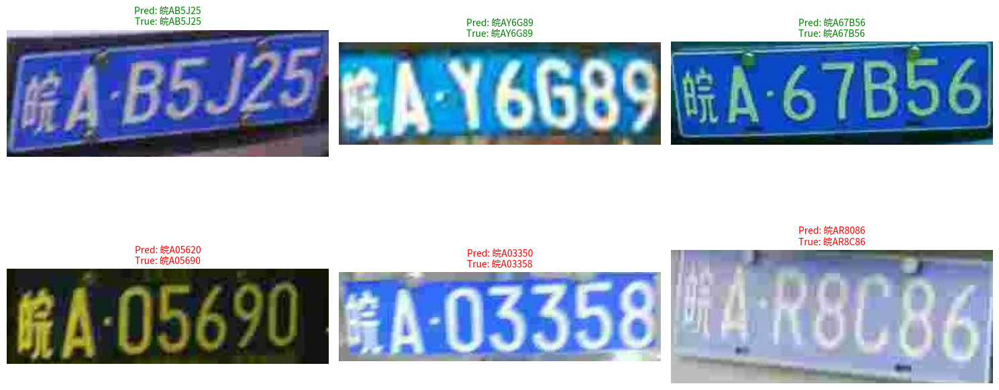


Salvati 83 errori in test_errors_pdlpr_base.csv


In [ ]:
dataset_type = 'base' # Test dataset


# 1. Load Model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
provinces = list("皖沪津渝冀晋蒙辽吉黑苏浙京闽赣鲁豫鄂湘粤桂琼川贵云藏陕甘青宁新警学")
ads = list("ABCDEFGHJKLMNPQRSTUVWXYZ0123456789")
charset = ['-'] + provinces + ads

char_to_idx = {c: i for i, c in enumerate(charset)}
idx_to_char = {i: c for i, c in enumerate(charset)}

max_label_length = 7  # Le targhe CCPD hanno 7 caratteri
num_classes = len(charset)

print(f"✅ Charset size: {num_classes}")
print(f"🔢 Blank index: {char_to_idx['-']}")

model = PDLPR(num_classes=num_classes,num_decoder_layers=3).to(device) # Instantiate with 6 decoder layers

checkpoint = torch.load('/content/drive/MyDrive/computerVisionProject/best_pdlpr_base_200k_model.pt', map_location=device)
model.load_state_dict(checkpoint['model_state_dict'])

# Config
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

yolo_preds_path = f'yolo_preds/yolo_preds_{dataset_type}.csv'
df = pd.read_csv(yolo_preds_path)
test_images_dir = f'/content/content/dataset/CCPD2019/ccpd_{dataset_type}'  # Directory with original images
output_dir = f'test_crops_{dataset_type}'  # Directory where cropped images will be saved
if os.path.exists(output_dir):
    shutil.rmtree(output_dir)
os.makedirs(output_dir, exist_ok=True)



def extract_license_plate(filename):
    provinces = ["皖", "沪", "津", "渝", "冀", "晋", "蒙", "辽", "吉", "黑", "苏", "浙", "京", "闽", "赣", "鲁", "豫", "鄂", "湘", "粤", "桂",
                "琼", "川", "贵", "云", "藏", "陕", "甘", "青", "宁", "新", "警", "学", "O"]
    alphabets = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'J', 'K', 'L', 'M', 'N', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W',
                'X', 'Y', 'Z', 'O']
    ads = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'J', 'K', 'L', 'M', 'N', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X',
          'Y', 'Z', '0', '1', '2', '3', '4', '5', '6', '7', '8', '9', 'O']

    parts = filename.split('-')
    if len(parts) < 5:
        return None

    lp_encoded = parts[4]
    char_codes = lp_encoded.split('_')

    if len(char_codes) != 7:
        return None

    try:
        province = provinces[int(char_codes[0])]
        letter = alphabets[int(char_codes[1])]
        char1 = ads[int(char_codes[2])]
        char2 = ads[int(char_codes[3])]
        char3 = ads[int(char_codes[4])]
        char4 = ads[int(char_codes[5])]
        char5 = ads[int(char_codes[6])]

        license_plate = province + letter + char1 + char2 + char3 + char4 + char5
        license_plate = license_plate.replace('O', '')

        return license_plate
    except (ValueError, IndexError):
        return None


all_preds = pd.read_csv(yolo_preds_path)

train_filenames_raw = pd.read_csv('/content/yolo_crops_labels_subset_100k.csv')['filename']
train_filenames = set(name.split('_', 2)[-1] for name in train_filenames_raw)

print(f"Numero di immagini totali: {len(all_preds)}")
print(f"Numero di immagini usate per training: {len(train_filenames)}")

test_preds = all_preds[~all_preds['filename'].isin(train_filenames)].reset_index(drop=True)
print(f"Numero di nuove immagini da processare: {len(test_preds)}")

# (Facoltativo) Limita a 5000 immagini
test_preds = test_preds.head(5000)
print(f"Numero di nuove immagini da processare (limitato a 5000): {len(test_preds)}")

# Check no overlap from train set and val set
filename_overlap = set(test_preds['filename']) & train_filenames
print(f"Overlap tra test e train (filename): {len(filename_overlap)}")  # Deve essere 0


# 3. Crop and save fn
def crop_and_save(row):
    img_path = os.path.join(test_images_dir, row['filename'])
    try:
        if row['iou'] >= 0.6:
            img = Image.open(img_path).convert('RGB')
            crop = img.crop((row['x1'], row['y1'], row['x2'], row['y2']))
            crop.save(os.path.join(output_dir, row['filename']))
            return True
    except Exception as e:
        print(f"Errore processando {row['filename']}: {str(e)}")
        return False


# 4. Preprocess images
print("Cropping immagini...")
success_count = 0
for _, row in tqdm(test_preds.iterrows(), total=len(test_preds)):
    if crop_and_save(row):
        success_count += 1
print(f"Immagini croppate con successo: {success_count}/{len(test_preds)}")

# 5. Test Dataset
class TestDataset(Dataset):
    def __init__(self, crop_dir, transform=None):
        self.crop_dir = crop_dir
        self.filenames = [f for f in os.listdir(crop_dir) if f.endswith(('.jpg', '.png', '.jpeg'))]
        self.transform = transform or transforms.Compose([
            transforms.Resize((64, 160)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # 3 canali
        ])

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, idx):
        img_path = os.path.join(self.crop_dir, self.filenames[idx])
        image = Image.open(img_path).convert('RGB')  # Assicura 3 canali
        if self.transform:
            image = self.transform(image)
        return image, self.filenames[idx]


test_dataset = TestDataset(output_dir)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)


model.eval()
print(f"✅ Modello PDLPR caricato con char_acc: {checkpoint['char_acc']:.4f}, seq_acc: {checkpoint['seq_acc']:.4f}")

class TestPDLPRDataset(Dataset):
    def __init__(self, crop_dir, transform=None):
        self.crop_dir = crop_dir
        self.filenames = [f for f in os.listdir(crop_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]
        self.filenames.sort()
        self.transform = transform or transforms.Compose([
            transforms.Resize((48, 144)),  # Input per PDLPR
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225]),
        ])

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, idx):
        img_name = self.filenames[idx]
        img_path = os.path.join(self.crop_dir, img_name)
        image = Image.open(img_path).convert('RGB')

        if self.transform:
            image = self.transform(image)

        return image, img_name  # ritorna anche nome file per il mapping output

print(f"Test dataset size: {len(test_dataset)}")

# 2. Run inference fn
def run_inference_with_gt(model, dataloader):
    results = []
    model.eval()

    with torch.no_grad():
        for images, filenames in tqdm(dataloader, desc='Inference'):
            images = images.to(device)

            logits = model(images) # (B, 7, num_classes)

            # Simple greedy decoding for the 7 positions
            predicted_indices = torch.argmax(logits, dim=2).cpu().numpy() # (B, 7)

            decoded_preds = []
            for pred_seq in predicted_indices:
                # Convert indices to characters
                decoded_plate = ''.join([charset[idx] if idx < len(charset) and idx != 0 else '' for idx in pred_seq]) # 0 is blank/padding
                decoded_preds.append(decoded_plate)


            for filename, pred in zip(filenames, decoded_preds):
                gt_plate = extract_license_plate(filename)
                if gt_plate is not None:
                    pred_clean = pred.rstrip('-')

                    results.append({
                        'filename': filename,
                        'predicted_plate': pred_clean, # Use cleaned prediction
                        'true_plate': gt_plate,
                        'correct': pred_clean == gt_plate
                    })

    return pd.DataFrame(results)

# 3. Inference
print("Eseguendo inference con PDLPR...")

results_df = run_inference_with_gt(model, test_loader)
results_df.to_csv(f'test_results_with_gt_pdlpr_{dataset_type}.csv', index=False)
print(f"Risultati salvati in test_results_with_gt_pdlpr_{dataset_type}.csv")

# 4. Metrics to evaluare the model
if len(results_df) > 0:
    accuracy = results_df['correct'].mean()
    print(f"\n📊 Sequence Accuracy (PDLPR): {accuracy:.2%}")

    results_df['predicted_length'] = results_df['predicted_plate'].str.len()
    results_df['true_length'] = results_df['true_plate'].str.len()
    length_matches = (results_df['predicted_length'] == results_df['true_length']).mean()

    print(f"\n🔢 Lunghezza corretta (pred vs GT): {length_matches:.2%}")

    total_chars_gt = 0
    correct_chars = 0
    total_edit_distance = 0
    total_samples_for_cer = 0


    for _, row in results_df.iterrows():
        pred_clean = row['predicted_plate']
        true_plate = row['true_plate']

        total_chars_gt += len(true_plate)
        min_len = min(len(pred_clean), len(true_plate))
        for i in range(min_len):
            if pred_clean[i] == true_plate[i]:
                correct_chars += 1

        # Calculate edit distance for CER
        if len(true_plate) > 0: # Avoid division by zero
             total_edit_distance += calculate_edit_distance(pred_clean, true_plate)
             total_samples_for_cer += 1


    char_acc = correct_chars / max(total_chars_gt, 1) # Avoid division by zero
    avg_cer = total_edit_distance / max(total_chars_gt, 1) # CER is total edit distance / total characters in GT

    print(f"\n🔡 Character-level accuracy: {char_acc:.2%}")
    print(f"\n📈 Character Error Rate (CER): {avg_cer:.4f}")


    print("\n10 esempi casuali:")
    print(results_df.sample(10))

    sample_results = pd.concat([
        results_df[results_df['correct']].sample(min(3, len(results_df[results_df['correct']] ))),
        results_df[~results_df['correct']].sample(min(3, len(results_df[~results_df['correct']] )))
    ])

    font_path = "/usr/share/fonts/opentype/noto/NotoSansCJK-Regular.ttc"
    font_prop = fm.FontProperties(fname=font_path)

    plt.figure(figsize=(15, 8))
    for i, (_, row) in enumerate(sample_results.iterrows(), 1):
        try:
            img = Image.open(os.path.join(output_dir, row['filename']))
            plt.subplot(2, 3, i)
            plt.imshow(img)
            color = 'green' if row['correct'] else 'red'
            plt.title(f"Pred: {row['predicted_plate']}\nTrue: {row['true_plate']}", color=color, fontproperties=font_prop)
            plt.axis('off')
        except FileNotFoundError:
             print(f"Warning: Image file not found for {row['filename']} in {output_dir}. Skipping visualization.")
             continue


    plt.tight_layout()
    plt.show()

    errors_df = results_df[~results_df['correct']]
    errors_df.to_csv(f'test_errors_pdlpr_{dataset_type}.csv', index=False)
    print(f"\nSalvati {len(errors_df)} errori in test_errors_pdlpr_{dataset_type}.csv")
else:
    print("\nNessun risultato valido ottenuto. Verifica che i filenames contengano codifica targa corretta.")